# Home Credit Default Risk

# GROUP-05-HCDR

***

## Team and project meta information

### Members:
* Athulya Anand - 2000923101 - athanand@iu.edu  
* Shubham Patil - 2000938033 - shupatil@iu.edu    
* Sricharraan Ramaswamy - 2000855651 - sriramas@iu.edu     
* Varsha R - 2000751388 - varavi@iu.edu

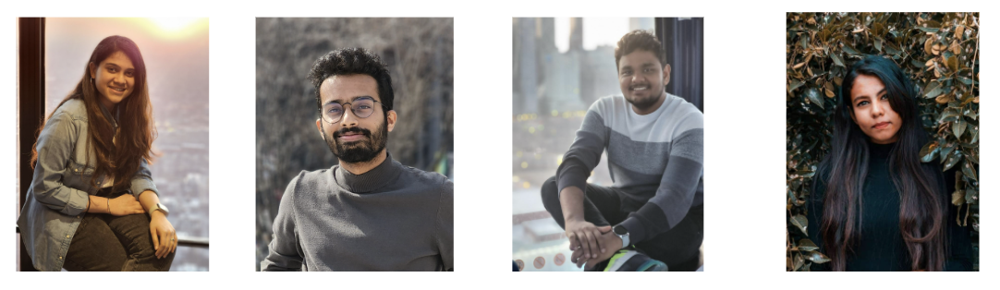

***

## Project Abstract

The course project is based on the [Home Credit Default Risk (HCDR)  Kaggle Competition](https://www.kaggle.com/c/home-credit-default-risk/).

The challenge is to construct a model that can predict the level of risk associated with an individual loan. With this project, we intend to use historical loan application data to predict whether or not a borrower will be able to repay a loan. 

After phase 1 and 2 implementation, we realized that it is best to add a few more models to the algorithm to compare and find the best fitting model as we were facing underfitting and overfitting with naive bayes and random forest models. Therefore, for the final phase, we have implemented all of the following in this project:
* Naive Bayes
* Logistic Regression
* Random Forest
* AdaBoost
* Bagging
* XGBoost
* Neural Networks

In phase 1, we faced issues related to data size, unwanted data and lack of data tuning. In phase 2, our main goal is to add feature engineering and hyperparameter tuning to the phase 1 algorithm. In phase 3, we will implement the other mentioned models and also implement neural networks.

The results for this project are as follows:
* Best model pipeline - XGBoost
* Kernel training score - 0.919455
* Kernel testing score - 0.918634
* ROC-AUC score - 0.739359
* Private kaggle score - 0.72362
* Public kaggle score - 0.72973

***

## Project Description (tasks and data)

### Data

Dataset link: https://www.kaggle.com/c/home-credit-default-risk/data

#### Background of the data

Home Credit is a non-banking financial institution, founded in 1997 in the Czech Republic.

The company operates in 14 countries (including United States, Russia, Kazahstan, Belarus, China, India) and focuses on lending primarily to people with little or no credit history which will either not obtain loans or became victims of untrustworthly lenders.

Home Credit group has over 29 million customers, total assests of 21 billions Euro, over 160 millions loans, with the majority in Asia and and almost half of them in China (as of 19-05-2018).

While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.

#### Data files overview
There are 7 different sources of data:

* __application_train/application_test:__ the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The training application data comes with the TARGET indicating __0: the loan was repaid__ or __1: the loan was not repaid__. The target variable defines if the client had payment difficulties meaning he/she had late payment more than X days on at least one of the first Y installments of the loan. Such case is marked as 1 while other all other cases as 0.
* __bureau:__ data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
* __bureau_balance:__ monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.
* __previous_application:__ previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
* __POS_CASH_BALANCE:__ monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
* credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
* __installments_payment:__ payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.

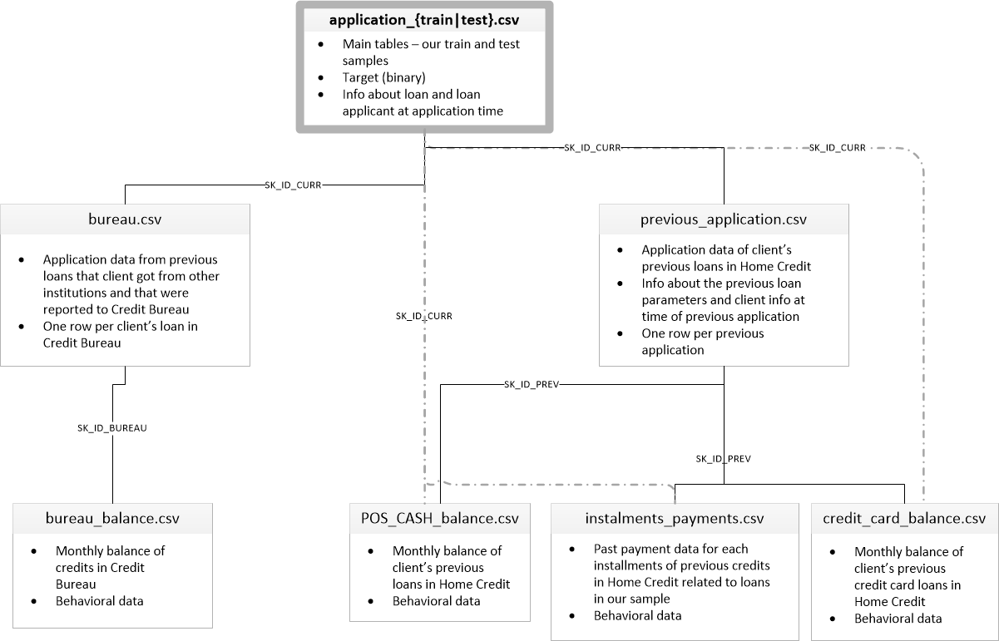

### Tasks

* __Eliminating the missing data:__ To check for any Kind of Null values/missing values in our data and to understand the type of values/datatype|featulespresentin the dataset values as zeroes.

* __Data joining/merging:__ Joining the features that have high correlation.

* __Best feature extraction:__ Extracting the top important features for the model pipelining and hyperparameter tuning.

* __Implementation of additional models:__ Implementation of AdaBoost, Bagging and XGBoost.

* __Implementation of neural netwroks:__ Implementing neural networks to check if it gives a better accuracy compared to other used models.

* __Kaggle submission:__ Get kaggle submission scores for each model used to see which is the best fitting model.

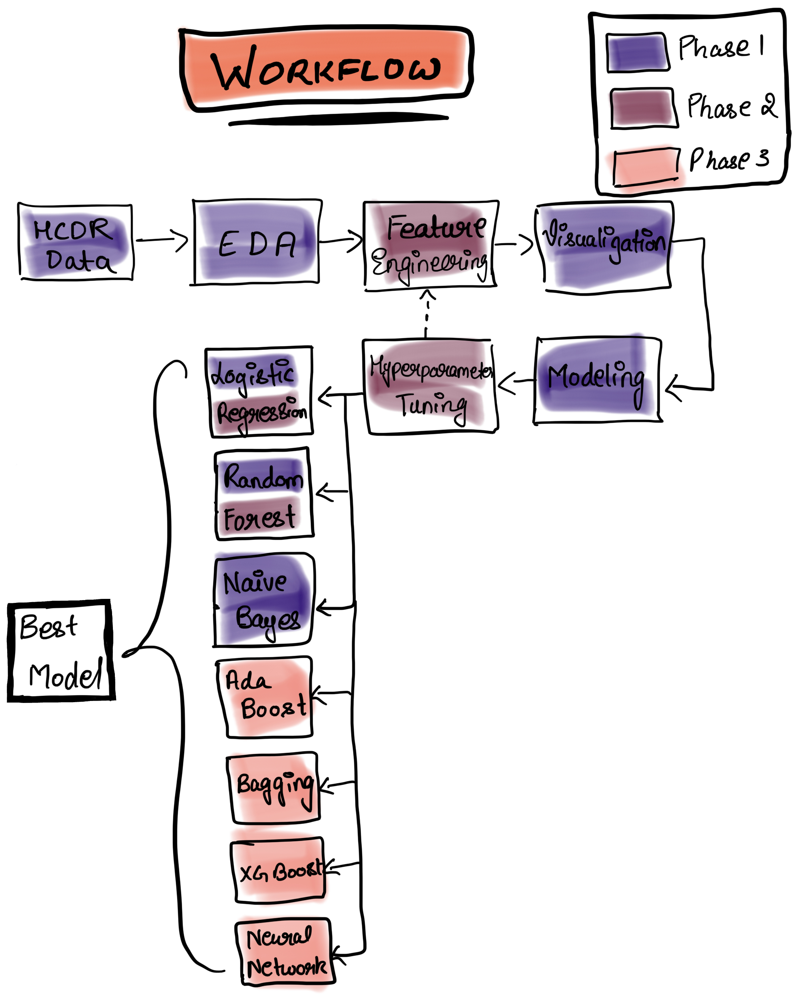

Importing all the necessary python libraries:

In [1]:
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt

Reading the csv data files:

In [2]:
df_train = pd.read_csv('/Users/athulyaanand/Downloads/application_train.csv')
df_test = pd.read_csv('/Users/athulyaanand/Downloads/application_test.csv')

In [3]:
bureau = pd.read_csv('/Users/athulyaanand/Downloads/bureau.csv')
bureau_balance = pd.read_csv('/Users/athulyaanand/Downloads/bureau_balance.csv')

In [4]:
install_payment = pd.read_csv('/Users/athulyaanand/Downloads/installments_payments.csv')
pos_cash_balance = pd.read_csv('/Users/athulyaanand/Downloads/POS_CASH_balance.csv')
previous_application = pd.read_csv('/Users/athulyaanand/Downloads/previous_application.csv')
credit_card_balance = pd.read_csv('/Users/athulyaanand/Downloads/credit_card_balance.csv')

In [5]:
install_payment = install_payment.groupby('SK_ID_CURR').median()
pos_cash_balance = pos_cash_balance.groupby('SK_ID_CURR').median()
previous_application = previous_application.groupby('SK_ID_CURR').median()
credit_card_balance = credit_card_balance.groupby('SK_ID_CURR').median()

***

## Exploratory Data Analysis + Feature Engineering

EDA, or exploratory data analysis, is an essential component of any Data Analysis or Data Science project. Essentially, EDA entails analyzing the dataset to identify patterns, anomalies (outliers), and hypotheses based on our understanding of the dataset.

EDA is primarily used to see what data can reveal beyond the formal modeling or hypothesis testing task and provides a provides a better understanding of data set variables and the relationships between them. It can also help determine if the statistical techniques you are considering for data analysis are appropriate.

### Data description using pandas dataframe

Pandas DataFrame is two-dimensional size-mutable, potentially heterogeneous tabular data structure with labeled axes (rows and columns). A Data frame is a two-dimensional data structure, i.e., data is aligned in a tabular fashion in rows and columns. Pandas DataFrame consists of three principal components, the data, rows, and columns.

* __head():__ This function returns the first n rows for the object based on position. It is useful for quickly testing if your object has the right type of data in it. For negative values of n, this function returns all rows except the last n rows, equivalent to df[:-n].

* __describe():__ Descriptive statistics include those that summarize the central tendency, dispersion and shape of a dataset’s distribution, excluding NaN values.

* __info():__ Pandas dataframe.info() function is used to get a concise summary of the dataframe. It comes really handy when doing exploratory analysis of the data. To get a quick overview of the dataset we use the dataframe.info() function.

#### Training data information

In [6]:
print ("\nhead():\n")
df_train.head()


head():



,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [7]:
print ("\ndescribe():\n")
df_train.describe()


describe():



,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


In [8]:
print ("\ninfo():\n")
df_train.info()


info():

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


#### Testing data information

In [9]:
print ("\nhead():\n")
df_test.head()
print(df_test.columns)


head():

Index(['SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR',
       'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT',
       'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=121)


In [10]:
print ("\ndescribe():\n")
df_test.describe()


describe():



,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,48744.000000,48744.000000,4.874400e+04,4.874400e+04,48720.000000,4.874400e+04,48744.000000,48744.000000,48744.000000,48744.000000,...,48744.000000,48744.0,48744.0,48744.0,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000
mean,277796.676350,0.397054,1.784318e+05,5.167404e+05,29426.240209,4.626188e+05,0.021226,-16068.084605,67485.366322,-4967.652716,...,0.001559,0.0,0.0,0.0,0.002108,0.001803,0.002787,0.009299,0.546902,1.983769
std,103169.547296,0.709047,1.015226e+05,3.653970e+05,16016.368315,3.367102e+05,0.014428,4325.900393,144348.507136,3552.612035,...,0.039456,0.0,0.0,0.0,0.046373,0.046132,0.054037,0.110924,0.693305,1.838873
min,100001.000000,0.000000,2.694150e+04,4.500000e+04,2295.000000,4.500000e+04,0.000253,-25195.000000,-17463.000000,-23722.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,188557.750000,0.000000,1.125000e+05,2.606400e+05,17973.000000,2.250000e+05,0.010006,-19637.000000,-2910.000000,-7459.250000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,277549.000000,0.000000,1.575000e+05,4.500000e+05,26199.000000,3.960000e+05,0.018850,-15785.000000,-1293.000000,-4490.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,367555.500000,1.000000,2.250000e+05,6.750000e+05,37390.500000,6.300000e+05,0.028663,-12496.000000,-296.000000,-1901.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000
max,456250.000000,20.000000,4.410000e+06,2.245500e+06,180576.000000,2.245500e+06,0.072508,-7338.000000,365243.000000,0.000000,...,1.000000,0.0,0.0,0.0,2.000000,2.000000,2.000000,6.000000,7.000000,17.000000


In [11]:
print ("\ninfo():\n")
df_test.info()


info():

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Columns: 121 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 45.0+ MB


### Feature Extraction

By creating new features from the existing ones (and then discarding the original features), Feature Extraction attempts to reduce the number of features in a dataset. The new reduced set of features will be able to summarize much of the information that was contained in the original set of features. Thus, an abridged version of the original features can be created by combining them.

In our analysis of the data, we found that there are many missing values. Columns with more than 25% of missing values were removed. Our team checked the columns for the distribution of 0's and removed the columns with 85% of rows with only 0's. In addition, we divided the data into numerical and categorical data. The numerical data was handled by creating an intermediate imputer pipeline in which the missing values were replaced with the mean of the data, while the missing values in categorical missing data were handled by encoding the data based upon OHE (One Hot Encoding) and replacing the missing values with the mode of the columns.

Firstly, let's find the percentage of the missing values in each column:

In [12]:
def missing_percentage(df):
    missing_values = df.isnull().sum(axis=0)*100/len(df)
    return missing_values.sort_values(ascending=False)

Using 25% as the missing treshold value, we extract all the columns that has missing percentage less than the treshold value:

,col_name,percentage_missing,median/Mode,mean,no_of_unique_values
0,COMMONAREA_MEDI,69.872297,0.0208,0.044595,3202
1,COMMONAREA_AVG,69.872297,0.0211,0.044621,3181
2,COMMONAREA_MODE,69.872297,0.019,0.042553,3128
3,NONLIVINGAPARTMENTS_MODE,69.432963,0.0,0.008076,167
4,NONLIVINGAPARTMENTS_AVG,69.432963,0.0,0.008809,386
5,NONLIVINGAPARTMENTS_MEDI,69.432963,0.0,0.008651,214
6,FONDKAPREMONT_MODE,68.386172,0 reg oper account dtype: object,NA,4
7,LIVINGAPARTMENTS_MODE,68.354953,0.0771,0.105645,736
8,LIVINGAPARTMENTS_AVG,68.354953,0.0756,0.100775,1868
9,LIVINGAPARTMENTS_MEDI,68.354953,0.0761,0.101954,1097


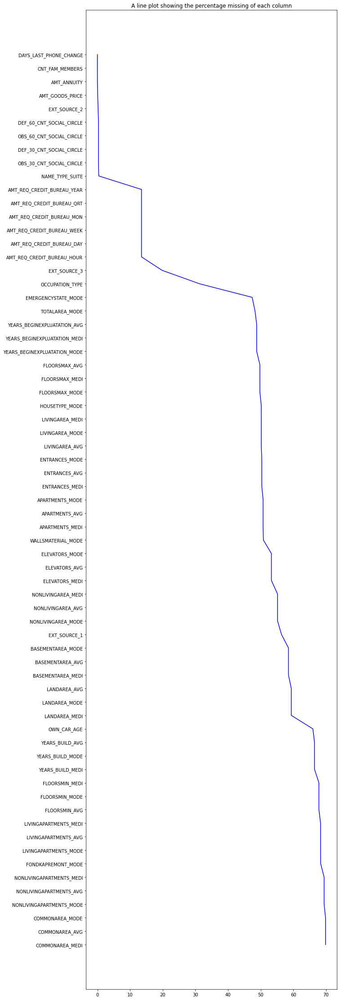

In [13]:
def missing(df,n):
  new_df = missing_percentage(df).reset_index()
  categorical_ = []
  new_df.columns = ['index','flag']
  final_df = []
  for row in new_df.itertuples():
    try:
      final_df.append([row.index,row.flag,df[row.index].median(),df[row.index].mean(), df[row.index].nunique()])
    except:
      final_df.append([row.index,row.flag,df[row.index].mode(),'NA',df[row.index].nunique()])
  columns = ['col_name','percentage_missing','median/Mode','mean','no_of_unique_values']
  temp = pd.DataFrame(final_df,columns=columns)   
  return  temp[temp['percentage_missing']>n]

df_25 = missing(df_train,25)
df_analysis = missing(df_train,0)
plt.figure(figsize=[10,40])
plt.plot(df_analysis['percentage_missing'],df_analysis['col_name'] ,color = 'b')
plt.title('A line plot showing the percentage missing of each column')
df_25

To optimize the data, we check each column for all the zero or null values and if 85% or more of the data in that column is filled with zero or null, we remove that particular column:

In [14]:
df_zero = pd.DataFrame()
columns = []
percentage =[]
for col in df_train.columns:
    if col == 'TARGET':
        continue
    count = (df_train[col] == 0).sum()
    columns.append(col)
    percentage.append(count/len(df_train[col]))
df_zero['Column'] = columns
df_zero['Percentage'] = percentage
per = 85/100
df_zero = df_zero[df_zero['Percentage']>per]

Printing all the columns that contain at least 85% of its data as either zero or null:

In [15]:
more_than_85 = df_zero
more_than_85

,Column,Percentage
26,FLAG_EMAIL,0.943280
33,REG_REGION_NOT_LIVE_REGION,0.984856
34,REG_REGION_NOT_WORK_REGION,0.949231
35,LIVE_REGION_NOT_WORK_REGION,0.959341
36,REG_CITY_NOT_LIVE_CITY,0.921827
91,DEF_30_CNT_SOCIAL_CIRCLE,0.882323
93,DEF_60_CNT_SOCIAL_CIRCLE,0.912881
95,FLAG_DOCUMENT_2,0.999958
97,FLAG_DOCUMENT_4,0.999919
98,FLAG_DOCUMENT_5,0.984885


Dropping all the columns that contain at least 85% of its data as either zero or null:

In [16]:
df_train.drop(columns = more_than_85['Column'],inplace = True)

In [17]:
df_train =df_train[df_train['NAME_FAMILY_STATUS']!='Unknown']
df_train =df_train[df_train['CODE_GENDER']!='XNA']
df_train =df_train[df_train['NAME_INCOME_TYPE']!='Maternity leave']

Saving all the training data targets in the numerical dataframe:

In [18]:
df_numerical= df_train.select_dtypes(exclude='object')
df_numerical['TARGET'] = df_train['TARGET']
df_categorical= df_train.select_dtypes(include='object')

<ipython-input-18-0c726e26b403>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_numerical['TARGET'] = df_train['TARGET']


In [19]:
df_numerical.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307500.000000,307500.000000,307500.000000,3.075000e+05,3.075000e+05,307488.000000,3.072240e+05,307500.000000,307500.000000,307500.000000,...,137824.000000,159074.000000,306479.000000,306479.000000,307499.000000,307500.000000,265986.000000,265986.000000,265986.000000,265986.000000
mean,278181.087798,0.080725,0.417034,1.687971e+05,5.990259e+05,27108.477604,5.383943e+05,0.020868,-16037.069246,63817.429333,...,0.028237,0.102548,1.422202,1.405248,-962.865681,0.710049,0.034363,0.267390,0.265476,1.899961
std,102789.822017,0.272413,0.722108,2.371263e+05,4.024936e+05,14493.600189,3.694459e+05,0.013831,4363.988872,141277.730537,...,0.070168,0.107464,2.400947,2.379760,826.813694,0.453740,0.204687,0.915997,0.794062,1.869288
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,-4292.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189146.750000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.041200,0.000000,0.000000,-1570.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.500000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.003100,0.068800,0.000000,0.000000,-757.000000,1.000000,0.000000,0.000000,0.000000,1.000000
75%,367143.250000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.026600,0.127600,2.000000,2.000000,-274.000000,1.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,348.000000,344.000000,0.000000,1.000000,8.000000,27.000000,261.000000,25.000000


In [20]:
df_categorical.describe()

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
count,307500,307500,307500,307500,306210,307500,307500,307500,307500,211112,307500,307500,97211,153208,151164,161750
unique,2,2,2,2,7,7,5,5,6,18,7,58,4,3,7,2
top,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,Laborers,TUESDAY,Business Entity Type 3,reg oper account,block of flats,Panel,No
freq,278230,202443,202916,213302,248520,158771,218387,196424,272859,55185,53898,67992,73827,150497,66037,159422


Checking co-relations of each numerical data which is greater than 3% for both positive and negative co-relation:

In [21]:
correlation = df_numerical.corr()['TARGET'].sort_values(ascending = False).reset_index()
correlation.columns = ['col_name','Correlation']
after_correlation = correlation[abs(correlation['Correlation'])>0.03]

after_correlation

,col_name,Correlation
0,TARGET,1.000000
1,DAYS_BIRTH,0.078236
2,REGION_RATING_CLIENT_W_CITY,0.060875
3,REGION_RATING_CLIENT,0.058882
4,DAYS_LAST_PHONE_CHANGE,0.055228
5,DAYS_ID_PUBLISH,0.051455
6,REG_CITY_NOT_WORK_CITY,0.050981
7,FLAG_EMP_PHONE,0.045978
8,FLAG_DOCUMENT_3,0.044371
9,DAYS_REGISTRATION,0.041950


Checking for data that contains no missing values in the categorical dataframe:

In [22]:
df_temp = missing(df_categorical,0)
df_temp

,col_name,percentage_missing,median/Mode,mean,no_of_unique_values
0,FONDKAPREMONT_MODE,68.386667,0 reg oper account dtype: object,NA,4
1,WALLSMATERIAL_MODE,50.840976,0 Panel dtype: object,NA,7
2,HOUSETYPE_MODE,50.176260,0 block of flats dtype: object,NA,3
3,EMERGENCYSTATE_MODE,47.398374,0 No dtype: object,NA,2
4,OCCUPATION_TYPE,31.345691,0 Laborers dtype: object,NA,18
5,NAME_TYPE_SUITE,0.419512,0 Unaccompanied dtype: object,NA,7


Dropping all the categorical dataframes that have missing values:

In [23]:
column_remove = ['FONDKAPREMONT_MODE','WALLSMATERIAL_MODE','HOUSETYPE_MODE','EMERGENCYSTATE_MODE','OCCUPATION_TYPE']
df_categorical.drop(columns = column_remove,inplace=True)

/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


***

## Visual Exploratory Data Analysis

In order to obtain a deeper understanding of the data, EDA involves generating summary statistics based on numerical data and creating various graphical representations in order to better understand the data. Data Visualization represents the text or numerical data in a visual format, which makes it easy to grasp the information the data express. We, humans, remember the pictures more easily than readable text, so Python provides us various libraries for data visualization like matplotlib, seaborn, plotly, etc. In this tutorial, we will use Matplotlib and seaborn for performing various techniques to explore data using various plots.

### Visual EDA on numerical data

Numerical data refers to the data that is in the form of numbers, and not in any language or descriptive form. 

* __Alias:__ Also known as quantitative data as it represents quantitative values to perform arithmetic operations on them. 

* __Type:__ Discrete data and Continuous data.

* __Analysis:__ Descriptive and inferential statistics.

* __Uses:__ Used for statistical calculations as a result of the potential performance of arithmetic operations.

* __Structures:__ It is structured data and can be quickly organized and made sense of.

In [24]:
df_numerical.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307500 entries, 0 to 307510
Data columns (total 78 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   SK_ID_CURR                    307500 non-null  int64  
 1   TARGET                        307500 non-null  int64  
 2   CNT_CHILDREN                  307500 non-null  int64  
 3   AMT_INCOME_TOTAL              307500 non-null  float64
 4   AMT_CREDIT                    307500 non-null  float64
 5   AMT_ANNUITY                   307488 non-null  float64
 6   AMT_GOODS_PRICE               307224 non-null  float64
 7   REGION_POPULATION_RELATIVE    307500 non-null  float64
 8   DAYS_BIRTH                    307500 non-null  int64  
 9   DAYS_EMPLOYED                 307500 non-null  int64  
 10  DAYS_REGISTRATION             307500 non-null  float64
 11  DAYS_ID_PUBLISH               307500 non-null  int64  
 12  OWN_CAR_AGE                   104579 non-nul

__Here we are plotting graphs of some columns which are positively correlated with target variable and analayzing the trends__

Text(0.5, 1.0, 'REGION_RATING_CLIENT_W_CITY vs TARGET')

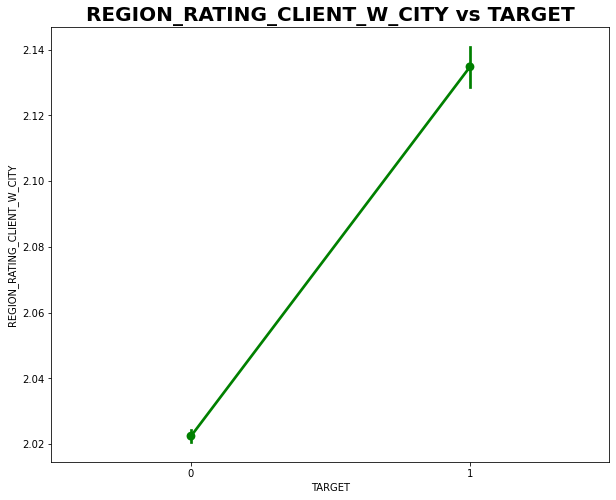

In [25]:
plt.figure(figsize=[10,8])
sb.pointplot(x='TARGET',y='REGION_RATING_CLIENT_W_CITY',data=df_numerical,color= 'GREEN')
plt.title("REGION_RATING_CLIENT_W_CITY vs TARGET", fontweight = 'bold', fontsize = 20)

Text(0.5, 1.0, 'DAYS_BIRTH vs TARGET')

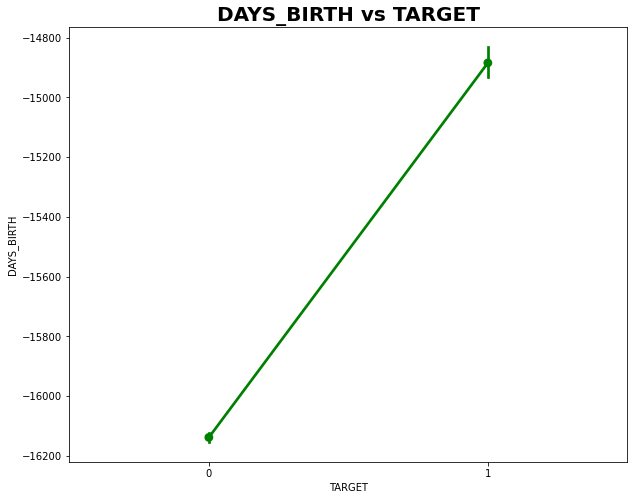

In [26]:
plt.figure(figsize=[10,8])
sb.pointplot(x='TARGET',y='DAYS_BIRTH',data=df_numerical,color= 'GREEN')
plt.title("DAYS_BIRTH vs TARGET", fontweight = 'bold', fontsize = 20)

Text(0.5, 1.0, 'REG_CITY_NOT_WORK_CITY vs TARGET')

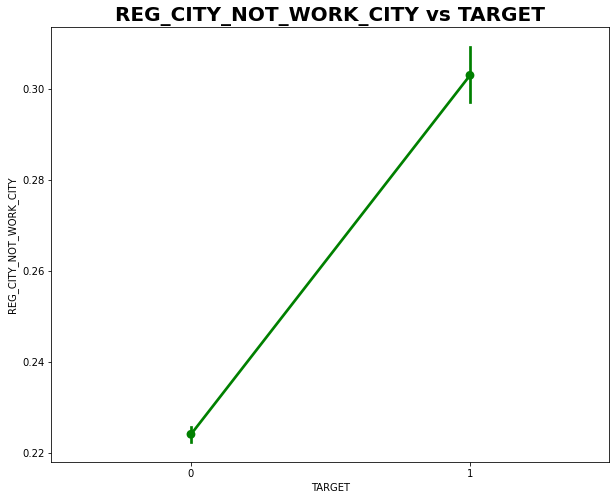

In [27]:
plt.figure(figsize=[10,8])
sb.pointplot(x='TARGET',y='REG_CITY_NOT_WORK_CITY',data=df_numerical,color= 'GREEN')
plt.title("REG_CITY_NOT_WORK_CITY vs TARGET", fontweight = 'bold', fontsize = 20)

__Here we are plotting graphs of some columns which are negatively correlated with target variable and analayzing the trends__

Text(0.5, 1.0, 'EXT_SOURCE_3 vs TARGET')

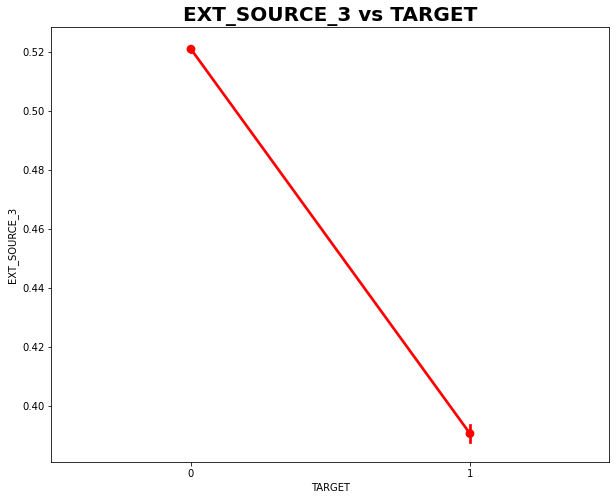

In [28]:
plt.figure(figsize=[10,8])
sb.pointplot(x='TARGET',y='EXT_SOURCE_3',data=df_numerical,color= 'RED')
plt.title("EXT_SOURCE_3 vs TARGET", fontweight = 'bold', fontsize = 20)

Text(0.5, 1.0, 'DAYS_EMPLOYED vs TARGET')

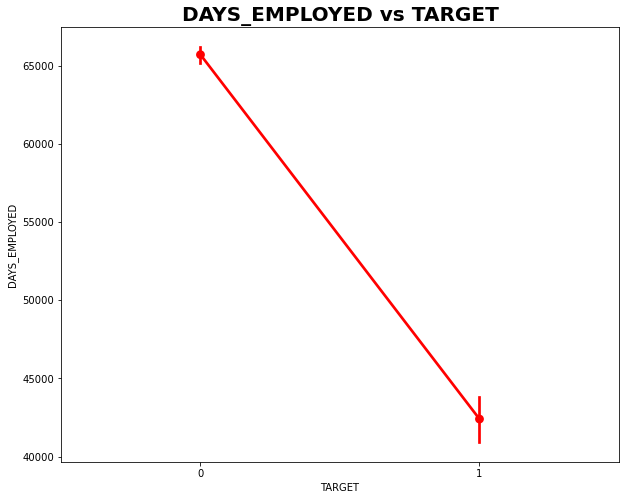

In [29]:
plt.figure(figsize=[10,8])
sb.pointplot(x='TARGET',y='DAYS_EMPLOYED',data=df_numerical,color= 'RED')
plt.title("DAYS_EMPLOYED vs TARGET", fontweight = 'bold', fontsize = 20)

Text(0.5, 1.0, 'AMT_CREDIT vs TARGET')

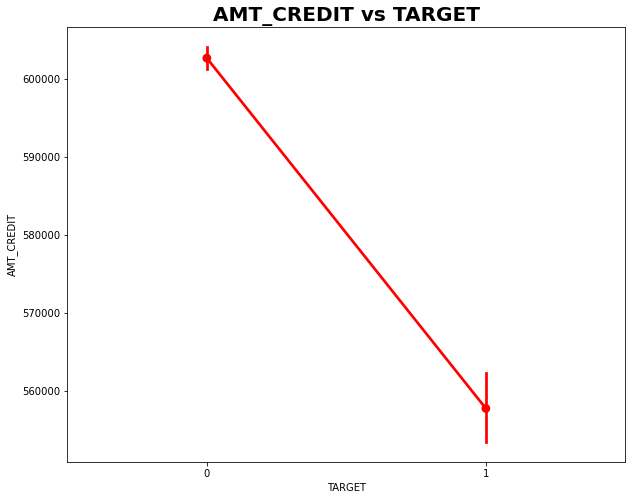

In [30]:
plt.figure(figsize=[10,8])
sb.pointplot(x='TARGET',y='AMT_CREDIT',data=df_numerical,color= 'RED')
plt.title("AMT_CREDIT vs TARGET", fontweight = 'bold', fontsize = 20)

__Plotting heatmap to analyze correlatoin in application train dataset__

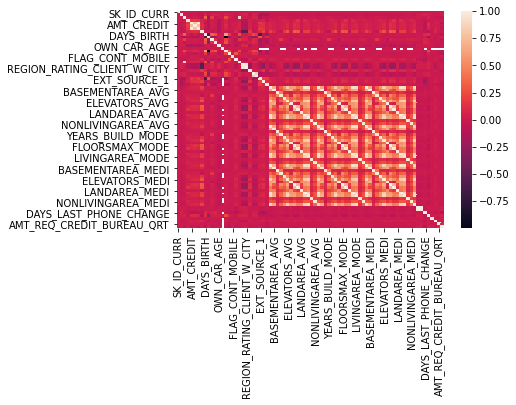

In [31]:
sb.heatmap(df_train.corr());

__Plotting heatmap to see correlation in application test dataset__

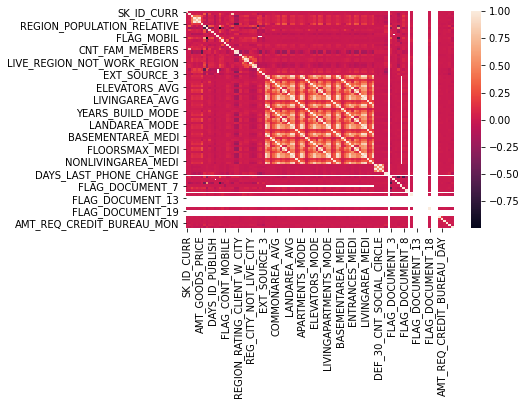

In [32]:
sb.heatmap(df_test.corr());

### Visual EDA on categorical data

Categorical data refers to a data type that can be stored and identified based on the names or labels given to them.

* __Alias:__ Also known as qualitative data as it qualifies data before classifying it.

* __Type:__ Nominal data and Ordinal data.

* __Analysis:__ Median and mode.

* __Uses:__ Used when a study requires respondents’ personal information, opinions and experiences. Commonly used in business research.

* __Structures:__ Is known as unstructured or semi-structured data.

In [33]:
df_categorical.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307500 entries, 0 to 307510
Data columns (total 11 columns):
 #   Column                      Non-Null Count   Dtype 
---  ------                      --------------   ----- 
 0   NAME_CONTRACT_TYPE          307500 non-null  object
 1   CODE_GENDER                 307500 non-null  object
 2   FLAG_OWN_CAR                307500 non-null  object
 3   FLAG_OWN_REALTY             307500 non-null  object
 4   NAME_TYPE_SUITE             306210 non-null  object
 5   NAME_INCOME_TYPE            307500 non-null  object
 6   NAME_EDUCATION_TYPE         307500 non-null  object
 7   NAME_FAMILY_STATUS          307500 non-null  object
 8   NAME_HOUSING_TYPE           307500 non-null  object
 9   WEEKDAY_APPR_PROCESS_START  307500 non-null  object
 10  ORGANIZATION_TYPE           307500 non-null  object
dtypes: object(11)
memory usage: 36.2+ MB


Y    213302
N     94198
Name: FLAG_OWN_REALTY, dtype: int64


/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'Percentage of loan in accordance to REALTY')

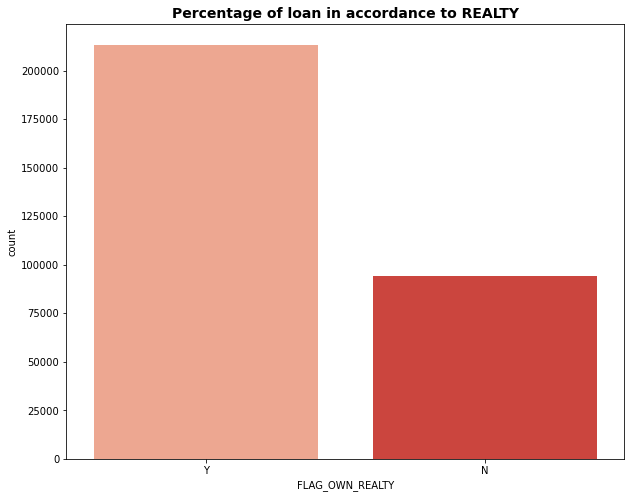

In [34]:
eda_cat1 = df_categorical['FLAG_OWN_REALTY'].value_counts()
print(eda_cat1)

plt.figure(figsize=[10,8])
sb.countplot(df_categorical['FLAG_OWN_REALTY'],palette = 'Reds')
plt.title("Percentage of loan in accordance to REALTY", fontweight = 'bold', fontsize = 14)

__From this graph we can figure out that if a person owns a realty or not__

Working                 158771
Commercial associate     71614
Pensioner                55362
State servant            21703
Unemployed                  22
Student                     18
Businessman                 10
Name: NAME_INCOME_TYPE, dtype: int64


/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'Percentage of loan in accordance to Income Type')

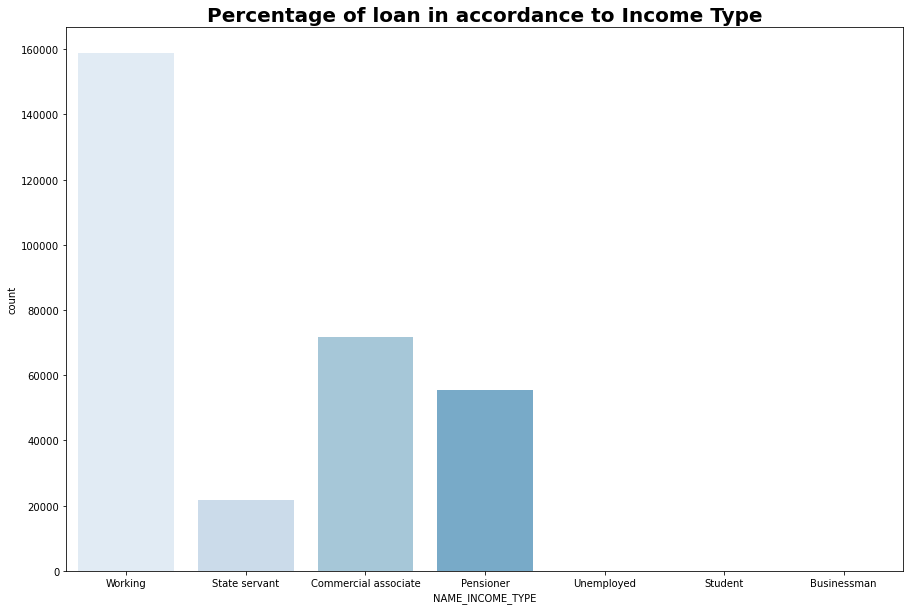

In [35]:
eda_cat2 = df_categorical['NAME_INCOME_TYPE'].value_counts()
print(eda_cat2)

plt.figure(figsize=[15,10])
sb.countplot(df_categorical['NAME_INCOME_TYPE'],palette = 'Blues')
plt.title("Percentage of loan in accordance to Income Type", fontweight = 'bold', fontsize = 20)

__From the above graph we can see that the most borrowing category are the people who are from the working class__

Cash loans         278230
Revolving loans     29270
Name: NAME_CONTRACT_TYPE, dtype: int64


/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'Percentage of loan in accordance to Contract Type')

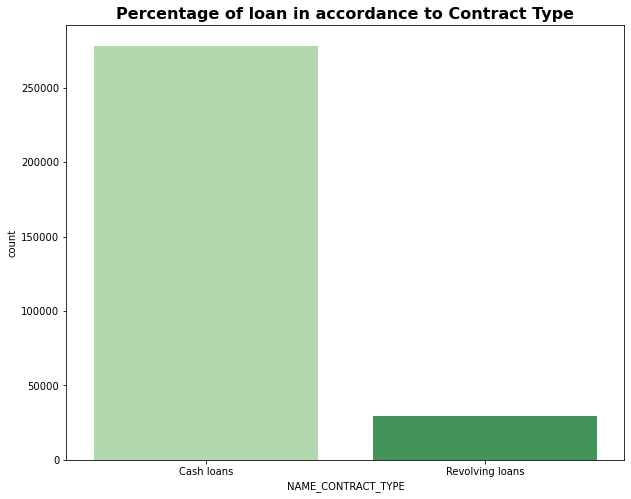

In [36]:
eda_cat3 = df_categorical['NAME_CONTRACT_TYPE'].value_counts()
print(eda_cat3)

plt.figure(figsize=[10,8])
sb.countplot(df_categorical['NAME_CONTRACT_TYPE'],palette = 'Greens')
plt.title("Percentage of loan in accordance to Contract Type", fontweight = 'bold', fontsize = 16)

__From the above graph we can see the type of loan people take__

/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


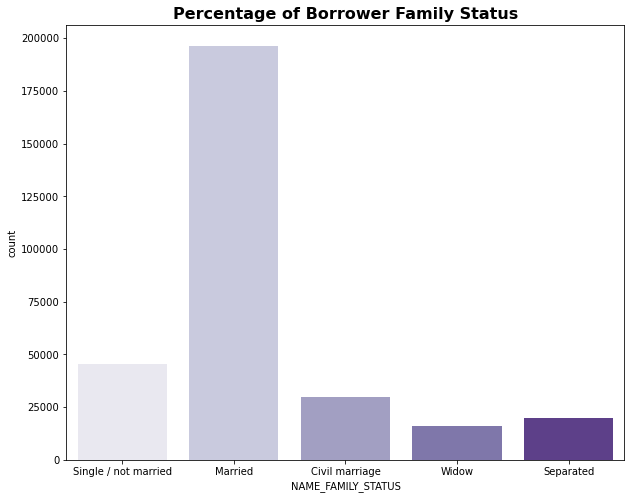

In [37]:
plt.figure(figsize=[10,8])
sb.countplot(df_categorical['NAME_FAMILY_STATUS'],palette = 'Purples')
plt.title('Percentage of Borrower Family Status', fontweight = 'bold', fontsize = 16)
plt.show()

__From the above pie chart we can that Married people tend borrow more money__

/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


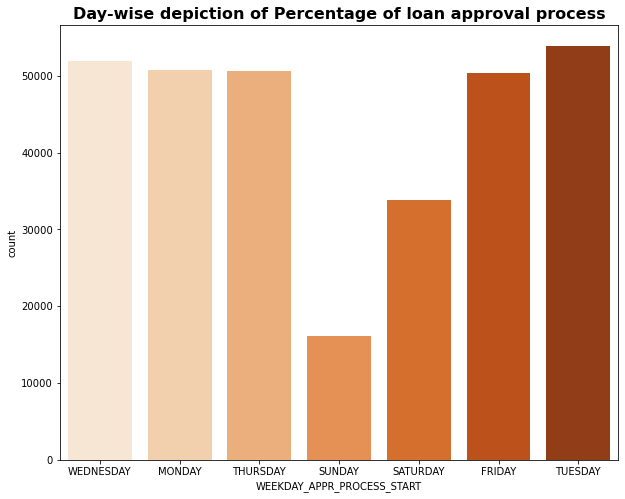

In [38]:
plt.figure(figsize=[10,8])
#plt.pie(df_categorical['WEEKDAY_APPR_PROCESS_START'].value_counts(),explode = (0.05,0.05,0.05,0.05,0.05,0.05,0.05),labels = df_categorical['WEEKDAY_APPR_PROCESS_START'].value_counts().index,autopct='%1.1f%%')
sb.countplot(df_categorical['WEEKDAY_APPR_PROCESS_START'],palette = 'Oranges')
plt.title('Day-wise depiction of Percentage of loan approval process', fontweight = 'bold', fontsize = 16)
plt.show()

***

## Modeling Pipelines

Now comes the fun part. Models are general rules in a statistical sense.Think of a machine learning model as tools in your toolbox. You will have access to many algorithms and use them to accomplish different goals. The better features you use the better your predictive power will be. After cleaning your data and finding what features are most important, using your model as a predictive tool will only enhance your model decision making.

Collectively, the linear sequence of steps required to prepare the data, tune the model, and transform the predictions is called the modeling pipeline. Modern machine learning libraries like the scikit-learn Python library allow this sequence of steps to be defined and used correctly (without data leakage) and consistently (during evaluation and prediction). A pipeline is a linear sequence of data preparation options, modeling operations, and prediction transform operations.

The modeling pipeline is an important tool for machine learning practitioners. Nevertheless, there are important implications that must be considered when using them. The main confusion for beginners when using pipelines comes in understanding what the pipeline has learned or the specific configuration discovered by the pipeline.

Therefore, for this project we are going to use 3 different modeling pipeline methods to perform home credit default risk prediction and they are:
* Naive Bayes
* Logistic Regression
* Random Forest

We will choose the model that gives the best accuracy for the home credit default risk prediction.

We will be using the following pipeline for this project:

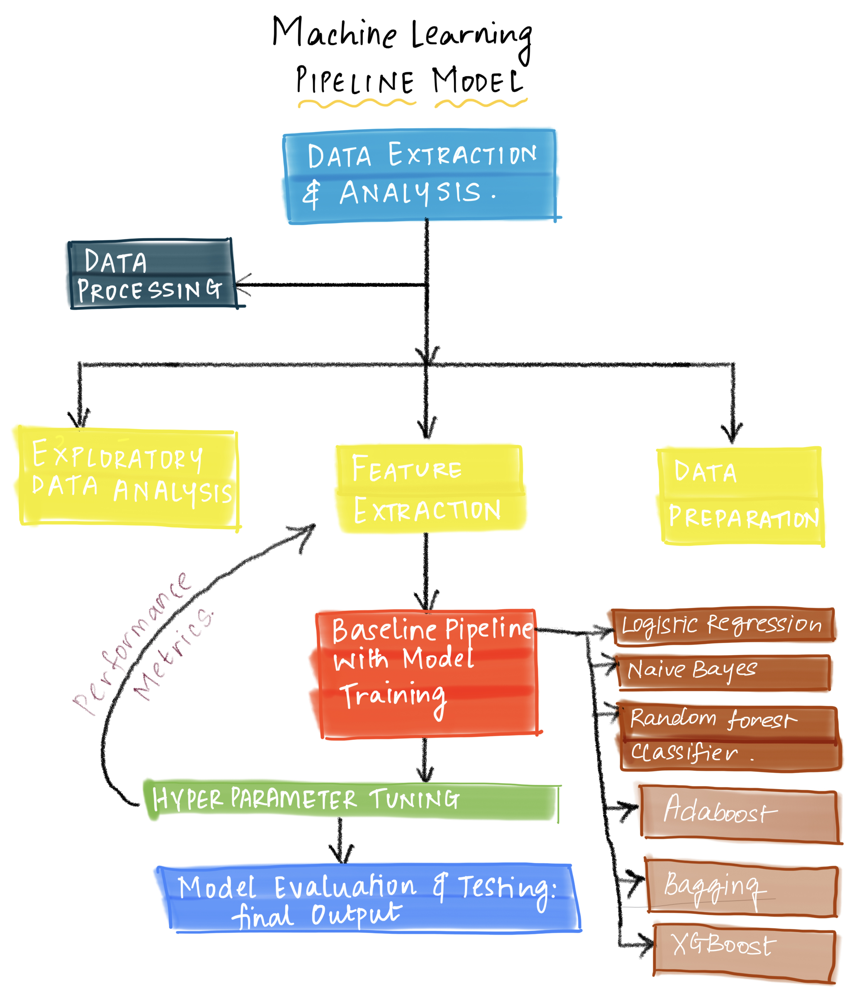

Importing all the necessary python libraries for the different pipelines we are going to use:

In [39]:
import warnings
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer, make_column_transformer
warnings.filterwarnings("ignore", category=DeprecationWarning)

Selecting only the columns that we have finally decided for the numerical and the categorical part:

In [40]:
df_cols = list(df_numerical.columns)+ list(df_categorical.columns)
df_i = df_train[df_cols]

Here for pipeline for numerical data(numerical_pipeline) we are imputing the missing values by mean of the column and for pipeline for categorical data(categorical_pipeline) we are imputing missing values by most frequent data and implementing one hot encoding for categorical pipeline to deal with categorical data. 

Then we have created a pipeline to merge numerical and categorical pipelines using ColumnTransformer.

In [41]:
numerical_pipeline = Pipeline([('imputer', SimpleImputer(strategy='mean'))])

categorical_pipeline = Pipeline([
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('ohe', OneHotEncoder(sparse=False, handle_unknown="ignore"))])

In [42]:
data_pipeline = ColumnTransformer([
    ("num_pipeline", numerical_pipeline, df_numerical.columns),
    ("cat_pipeline", categorical_pipeline, df_categorical.columns)], n_jobs = -1)
df_transformed = data_pipeline.fit_transform(df_i)
final_column_names = list(df_numerical.columns)  + \
               list(data_pipeline.transformers_[1][1].named_steps["ohe"].get_feature_names(df_categorical.columns))

Saving transformed dataset used for the model training:

In [43]:
df_final = pd.DataFrame(df_transformed,  columns=final_column_names)
df_temp = df_final
df_final

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,ORGANIZATION_TYPE_Trade: type 4,ORGANIZATION_TYPE_Trade: type 5,ORGANIZATION_TYPE_Trade: type 6,ORGANIZATION_TYPE_Trade: type 7,ORGANIZATION_TYPE_Transport: type 1,ORGANIZATION_TYPE_Transport: type 2,ORGANIZATION_TYPE_Transport: type 3,ORGANIZATION_TYPE_Transport: type 4,ORGANIZATION_TYPE_University,ORGANIZATION_TYPE_XNA
0,100002.0,1.0,0.0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461.0,-637.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,100003.0,0.0,0.0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765.0,-1188.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004.0,0.0,0.0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046.0,-225.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006.0,0.0,0.0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005.0,-3039.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,100007.0,0.0,0.0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932.0,-3038.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307495,456251.0,0.0,0.0,157500.0,254700.0,27558.0,225000.0,0.032561,-9327.0,-236.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
307496,456252.0,0.0,0.0,72000.0,269550.0,12001.5,225000.0,0.025164,-20775.0,365243.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
307497,456253.0,0.0,0.0,153000.0,677664.0,29979.0,585000.0,0.005002,-14966.0,-7921.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
307498,456254.0,1.0,0.0,171000.0,370107.0,20205.0,319500.0,0.005313,-11961.0,-4786.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


We are merging the different dataframes together according to the data diagram shown in the data description section above using primary keys:

In [44]:
previous_application = pd.merge(left=previous_application, right=pos_cash_balance, how='left', left_on='SK_ID_CURR', right_on='SK_ID_CURR')
previous_application = pd.merge(left=previous_application, right=install_payment, how='left', left_on='SK_ID_CURR', right_on='SK_ID_CURR')
previous_application = pd.merge(left=previous_application, right=credit_card_balance, how='left', left_on='SK_ID_CURR', right_on='SK_ID_CURR')

In [45]:
df_final = pd.merge(left=df_final, right=previous_application, how='left', left_on='SK_ID_CURR', right_on='SK_ID_CURR')
bureau = pd.merge(left=bureau, right=bureau_balance, how='left', left_on='SK_ID_BUREAU', right_on='SK_ID_BUREAU')


In [46]:
df_final

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,SK_DPD_y,SK_DPD_DEF_y
0,100002.0,1.0,0.0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461.0,-637.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,100003.0,0.0,0.0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765.0,-1188.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,100004.0,0.0,0.0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046.0,-225.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,100006.0,0.0,0.0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005.0,-3039.0,...,0.0,0.0,0.0,NaN,0.0,NaN,NaN,0.0,0.0,0.0
4,100007.0,0.0,0.0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932.0,-3038.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307495,456251.0,0.0,0.0,157500.0,254700.0,27558.0,225000.0,0.032561,-9327.0,-236.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
307496,456252.0,0.0,0.0,72000.0,269550.0,12001.5,225000.0,0.025164,-20775.0,365243.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
307497,456253.0,0.0,0.0,153000.0,677664.0,29979.0,585000.0,0.005002,-14966.0,-7921.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
307498,456254.0,1.0,0.0,171000.0,370107.0,20205.0,319500.0,0.005313,-11961.0,-4786.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


We are merging training dataset with the bureau after cleaning the bureau dataset:

In [47]:
bureau = bureau.drop_duplicates()
bureau.shape
bureau = bureau.groupby(['SK_ID_CURR','SK_ID_BUREAU']).min()

clean_bureau = bureau[['DAYS_CREDIT','DAYS_ENDDATE_FACT','AMT_CREDIT_SUM','DAYS_CREDIT_UPDATE','MONTHS_BALANCE']]
clean_bureau = clean_bureau.reset_index()
clean_bureau = clean_bureau.groupby('SK_ID_CURR').median()
clean_bureau = clean_bureau.reset_index()

In [48]:
df_final = pd.merge(left=df_final, right=clean_bureau, how='left', left_on='SK_ID_CURR', right_on='SK_ID_CURR')
df_final.head()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,SK_DPD_y,SK_DPD_DEF_y,SK_ID_BUREAU,DAYS_CREDIT,DAYS_ENDDATE_FACT,AMT_CREDIT_SUM,DAYS_CREDIT_UPDATE,MONTHS_BALANCE
0,100002.0,1.0,0.0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461.0,-637.0,...,NaN,NaN,NaN,NaN,6158905.5,-1042.5,-939.0,54130.50,-402.5,-34.0
1,100003.0,0.0,0.0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765.0,-1188.0,...,NaN,NaN,NaN,NaN,5885878.5,-1205.5,-621.0,92576.25,-545.0,NaN
2,100004.0,0.0,0.0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046.0,-225.0,...,NaN,NaN,NaN,NaN,6829133.5,-867.0,-532.5,94518.90,-532.0,NaN
3,100006.0,0.0,0.0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005.0,-3039.0,...,NaN,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007.0,0.0,0.0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932.0,-3038.0,...,NaN,NaN,NaN,NaN,5987200.0,-1149.0,-783.0,146250.00,-783.0,NaN


In [49]:
clean_bureau

,SK_ID_CURR,SK_ID_BUREAU,DAYS_CREDIT,DAYS_ENDDATE_FACT,AMT_CREDIT_SUM,DAYS_CREDIT_UPDATE,MONTHS_BALANCE
0,100001,5896633.0,-857.0,-715.0,168345.00,-155.0,-28.0
1,100002,6158905.5,-1042.5,-939.0,54130.50,-402.5,-34.0
2,100003,5885878.5,-1205.5,-621.0,92576.25,-545.0,NaN
3,100004,6829133.5,-867.0,-532.5,94518.90,-532.0,NaN
4,100005,6735201.0,-137.0,-123.0,58500.00,-31.0,-4.0
...,...,...,...,...,...,...,...
305806,456249,5371700.0,-1680.0,-1279.0,248692.50,-909.0,NaN
305807,456250,6817237.0,-824.0,-760.0,483349.50,-31.0,-27.0
305808,456253,6098498.5,-919.0,-794.0,675000.00,-153.5,-30.0
305809,456254,6669849.0,-1104.0,-859.0,45000.00,-401.0,-36.0


Defining a function to find target correlation with the other features:

In [50]:
def corr_target(df,cor):
    correlation = df.corr()['TARGET'].sort_values(ascending=False).reset_index()
    correlation.columns = ['col_name','Correlation']
    after_correlation = correlation[abs(correlation['Correlation'])>cor]
    return after_correlation

In [51]:
df_final_features = df_final
df_final_features.head()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,SK_DPD_y,SK_DPD_DEF_y,SK_ID_BUREAU,DAYS_CREDIT,DAYS_ENDDATE_FACT,AMT_CREDIT_SUM,DAYS_CREDIT_UPDATE,MONTHS_BALANCE
0,100002.0,1.0,0.0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461.0,-637.0,...,NaN,NaN,NaN,NaN,6158905.5,-1042.5,-939.0,54130.50,-402.5,-34.0
1,100003.0,0.0,0.0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765.0,-1188.0,...,NaN,NaN,NaN,NaN,5885878.5,-1205.5,-621.0,92576.25,-545.0,NaN
2,100004.0,0.0,0.0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046.0,-225.0,...,NaN,NaN,NaN,NaN,6829133.5,-867.0,-532.5,94518.90,-532.0,NaN
3,100006.0,0.0,0.0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005.0,-3039.0,...,NaN,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007.0,0.0,0.0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932.0,-3038.0,...,NaN,NaN,NaN,NaN,5987200.0,-1149.0,-783.0,146250.00,-783.0,NaN


We are additionally adding a few self-made features to the training dataset and they are as follows:

In [52]:
df_final_features['FEATURE1']= df_final_features['AMT_TOTAL_RECEIVABLE']/(df_final_features['AMT_BALANCE']+1)
df_final_features['FEATURE2'] = df_final_features['AMT_TOTAL_RECEIVABLE']/(df_final_features['AMT_RECIVABLE']+1)
df_final_features['FEATURE3'] = df_final_features['AMT_TOTAL_RECEIVABLE']/(df_final_features['AMT_RECEIVABLE_PRINCIPAL']+1)
df_final_features['FEATURE4']=df_final_features['AMT_CREDIT_x'] / (df_final_features['AMT_INCOME_TOTAL']+1)
df_final_features['FEATURE5']=df_final_features['AMT_ANNUITY_x'] / (df_final_features['AMT_INCOME_TOTAL']+1)
df_final_features['FEATURE6']= df_final_features['AMT_ANNUITY_x'] / (df_final_features['AMT_CREDIT_x'] +1)
df_final_features['FEATURE7']=(df_final_features['EXT_SOURCE_1']*df_final_features['EXT_SOURCE_2']*df_final_features['EXT_SOURCE_3'])

In [53]:
df_final_features

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,AMT_CREDIT_SUM,DAYS_CREDIT_UPDATE,MONTHS_BALANCE,FEATURE1,FEATURE2,FEATURE3,FEATURE4,FEATURE5,FEATURE6,FEATURE7
0,100002.0,1.0,0.0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461.0,-637.0,...,54130.50,-402.5,-34.0,NaN,NaN,NaN,2.007879,0.121977,0.060749,0.003043
1,100003.0,0.0,0.0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765.0,-1188.0,...,92576.25,-545.0,NaN,NaN,NaN,NaN,4.790732,0.132216,0.027598,0.098945
2,100004.0,0.0,0.0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046.0,-225.0,...,94518.90,-532.0,NaN,NaN,NaN,NaN,1.999970,0.099999,0.050000,0.203649
3,100006.0,0.0,0.0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005.0,-3039.0,...,NaN,NaN,NaN,0.0,0.0,0.0,2.316150,0.219898,0.094941,0.166847
4,100007.0,0.0,0.0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932.0,-3038.0,...,146250.00,-783.0,NaN,NaN,NaN,NaN,4.222187,0.179961,0.042623,0.082786
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307495,456251.0,0.0,0.0,157500.0,254700.0,27558.0,225000.0,0.032561,-9327.0,-236.0,...,NaN,NaN,NaN,NaN,NaN,NaN,1.617133,0.174970,0.108197,0.050690
307496,456252.0,0.0,0.0,72000.0,269550.0,12001.5,225000.0,0.025164,-20775.0,365243.0,...,NaN,NaN,NaN,NaN,NaN,NaN,3.743698,0.166685,0.044524,0.029753
307497,456253.0,0.0,0.0,153000.0,677664.0,29979.0,585000.0,0.005002,-14966.0,-7921.0,...,675000.00,-153.5,-30.0,NaN,NaN,NaN,4.429148,0.195940,0.044239,0.087235
307498,456254.0,1.0,0.0,171000.0,370107.0,20205.0,319500.0,0.005313,-11961.0,-4786.0,...,45000.00,-401.0,-36.0,NaN,NaN,NaN,2.164356,0.118157,0.054592,0.170659


Finding the correlation between the newly made features and the target feature:

In [54]:
feature_correlations = df_final_features[['FEATURE1','FEATURE2','FEATURE3','FEATURE4','FEATURE5','FEATURE6','FEATURE7','TARGET']].corr()
feature_correlations

,FEATURE1,FEATURE2,FEATURE3,FEATURE4,FEATURE5,FEATURE6,FEATURE7,TARGET
FEATURE1,1.000000,0.048508,0.113956,-0.000901,-0.002146,-0.003188,0.001960,-0.000746
FEATURE2,0.048508,1.000000,0.053074,-0.049499,-0.059499,-0.013560,-0.107162,0.097484
FEATURE3,0.113956,0.053074,1.000000,0.002338,-0.000230,-0.005639,-0.003305,0.000280
FEATURE4,-0.000901,-0.049499,0.002338,1.000000,0.788086,-0.522153,0.072455,-0.007821
FEATURE5,-0.002146,-0.059499,-0.000230,0.788086,1.000000,-0.029672,0.040208,0.014210
FEATURE6,-0.003188,-0.013560,-0.005639,-0.522153,-0.029672,1.000000,-0.053857,0.012722
FEATURE7,0.001960,-0.107162,-0.003305,0.072455,0.040208,-0.053857,1.000000,-0.189587
TARGET,-0.000746,0.097484,0.000280,-0.007821,0.014210,0.012722,-0.189587,1.000000


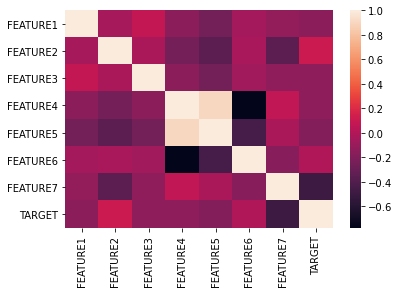

In [55]:
sb.heatmap(feature_correlations.corr());

In [56]:
df_final_features = df_final_features.rename(columns = {'AMT_CREDIT_y':'AMT_CREDIT'})
df_final_features = df_final_features.apply(lambda x: x.fillna(x.median()),axis=0)

In [57]:
df_final_features.shape

(307500, 248)

We are shortlisting all the features with a correlation value of greater than 8% with respect to target:

In [58]:
corr_greater_than_5= corr_target(df_final_features,0.05)
corr_greater_than_5.shape

(18, 2)

In [59]:
selected_features = corr_greater_than_5['col_name']
new_features = df_final_features[selected_features]

In [60]:
models_results = []
Target = df_final_features['TARGET']

In [61]:
new_features
new_features.to_csv('final_application_train.csv')

Using the shortlisted features for the training dataset and spliting the whole dataset into training and testing datasets:

In [62]:
y=Target.values
X =new_features.drop(columns =[ 'TARGET']).values
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.20, random_state=98)

We have performed following experiments with different groups of features that we have newly created. With the hypermarameter tuning and the datasets including these features we have calculated the accuracies for different models. Then we have found the best group of features from these experiment.

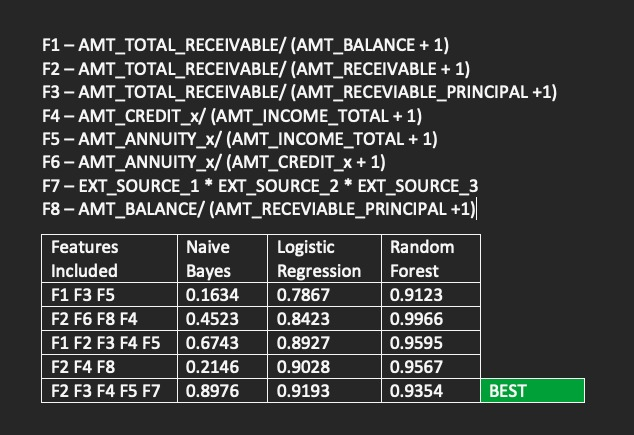

### Hyperparameter Tuning

Link: https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html 

When creating a machine learning model, you'll be presented with design choices as to how to define your model architecture. Often times, we don't immediately know what the optimal model architecture should be for a given model, and thus we'd like to be able to explore a range of possibilities. In true machine learning fashion, we'll ideally ask the machine to perform this exploration and select the optimal model architecture automatically. Parameters which define the model architecture are referred to as hyperparameters and thus this process of searching for the ideal model architecture is referred to as hyperparameter tuning.

We can use GridSearch to tune the hyperparameters. Grid Search uses a different combination of all the specified hyperparameters and their values and calculates the performance for each combination and selects the best value for the hyperparameters. This makes the processing time-consuming and expensive based on the number of hyperparameters involved. In GridSearchCV, along with Grid Search, cross-validation is also performed. Cross-Validation is used while training the model. As we know that before training the model with data, we divide the data into two parts – train data and test data. In cross-validation, the process divides the train data further into two parts – the train data and the validation data.

#### Naive Bayes

Library: https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.GaussianNB.html

Naive Bayes is a basic but effective probabilistic classification model in machine learning that draws influence from Bayes Theorem.

Bayes theorem is a formula that offers a conditional probability of an event A taking happening given another event B has previously happened. Its mathematical formula is as follows: –

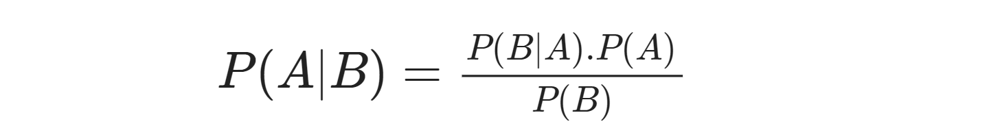

Where

A and B are two events
P(A|B) is the probability of event A provided event B has already happened.
P(B|A) is the probability of event B provided event A has already happened.
P(A) is the independent probability of A
P(B) is the independent probability of B
Now, this Bayes theorem can be used to generate the following classification model –

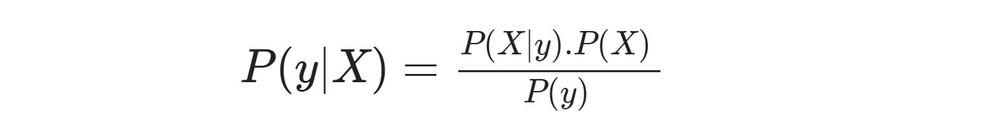

Where

X = x1,x2,x3,.. xN аre list оf indeрendent рrediсtоrs
y is the class label
P(y|X) is the probability of label y given the predictors X
The above equation may be extended as follows:

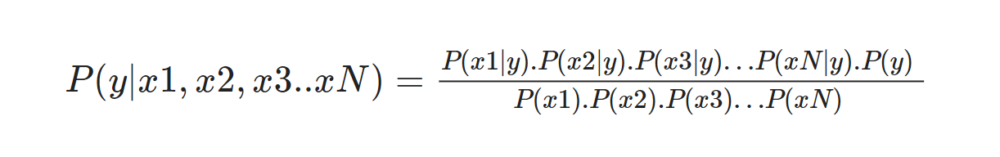

We are not considering Naive Bayes model from phase 2 onwards because the accuracy given by this model was the least during phase 1.

In [63]:
pipe_naive_bayes = Pipeline([
('scaler', StandardScaler()),
('classifier', GaussianNB())])
 
pipe_naive_bayes.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()), ('classifier', GaussianNB())])

#### Logistic Regression

Library: https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html

Logistic regression is a statistical method for predicting binary classes. The outcome or target variable is dichotomous in nature. Dichotomous means there are only two possible classes. For example, it can be used for cancer detection problems. It computes the probability of an event occurrence.

It is a special case of linear regression where the target variable is categorical in nature. It uses a log of odds as the dependent variable. Logistic Regression predicts the probability of occurrence of a binary event utilizing a logit function.

Linear Regression Equation:

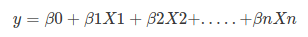

Where, y is dependent variable and x1, x2 ... and Xn are explanatory variables.

Sigmoid Function:

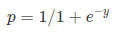

Apply Sigmoid function on linear regression:

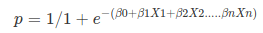

Properties of Logistic Regression:

The dependent variable in logistic regression follows Bernoulli Distribution.
Estimation is done through maximum likelihood.
No R Square, Model fitness is calculated through Concordance, KS-Statistics.

In [64]:
pipe = Pipeline([
('scaler', StandardScaler()),
('classifier', GridSearchCV(LogisticRegression(solver='newton-cg', max_iter=1500),
                                 param_grid={'C': [ 0.1,1,5,10.]},
                                 cv=5,
                                 refit=True))
])
pipe.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('classifier',
                 GridSearchCV(cv=5,
                              estimator=LogisticRegression(max_iter=1500,
                                                           solver='newton-cg'),
                              param_grid={'C': [0.1, 1, 5, 10.0]}))])

In [65]:
pipe.named_steps['classifier'].best_params_

{'C': 0.1}

#### Random Forest

Library: https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html

Random forest is a Supervised Machine Learning Algorithm that is used widely in Classification and Regression problems. It builds decision trees on different samples and takes their majority vote for classification and average in case of regression.

Random forest works on the Bagging principle. Bagging, also known as Bootstrap Aggregation is the ensemble technique used by random forest. Bagging chooses a random sample from the data set. Hence each model is generated from the samples (Bootstrap Samples) provided by the Original Data with replacement known as row sampling. This step of row sampling with replacement is called bootstrap. Now each model is trained independently which generates results. The final output is based on majority voting after combining the results of all models. This step which involves combining all the results and generating output based on majority voting is known as aggregation.

Steps involved in random forest algorithm:

* Step 1: In Random forest n number of random records are taken from the data set having k number of records.

* Step 2: Individual decision trees are constructed for each sample.

* Step 3: Each decision tree will generate an output.

* Step 4: Final output is considered based on Majority Voting or Averaging for Classification and regression respectively.

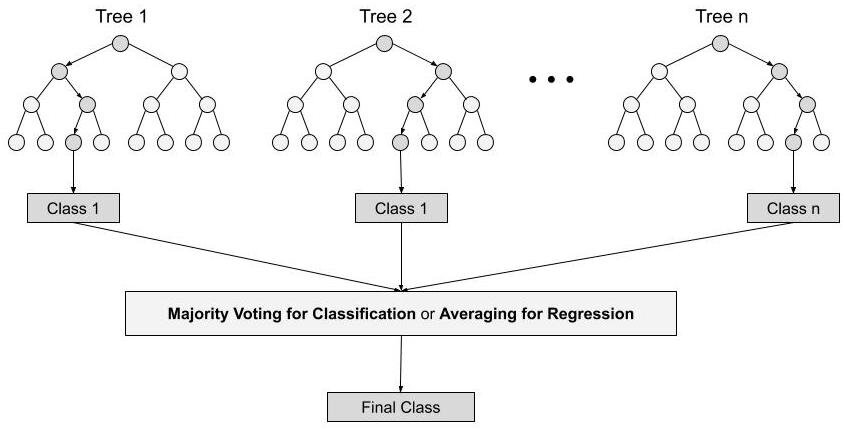

In [66]:
param_grid = { 
    'n_estimators': [40,50,60],
    'max_features': ['auto'],
    'max_depth' : [15,20,25],
    'criterion' :['entropy']
}

In [67]:
pipe1 = Pipeline([
('scaler', StandardScaler()),
('classifier', GridSearchCV(RandomForestClassifier(),
                                 param_grid=param_grid,
                                 cv=5,
                                 refit=True))
])
pipe1.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('classifier',
                 GridSearchCV(cv=5, estimator=RandomForestClassifier(),
                              param_grid={'criterion': ['entropy'],
                                          'max_depth': [15, 20, 25],
                                          'max_features': ['auto'],
                                          'n_estimators': [40, 50, 60]}))])

#### ADABoost

Library: https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.AdaBoostClassifier.html

Ada-boost or Adaptive Boosting is one of ensemble boosting classifier proposed by Yoav Freund and Robert Schapire in 1996. It combines multiple classifiers to increase the accuracy of classifiers. AdaBoost is an iterative ensemble method. AdaBoost classifier builds a strong classifier by combining multiple poorly performing classifiers so that you will get high accuracy strong classifier. The basic concept behind Adaboost is to set the weights of classifiers and training the data sample in each iteration such that it ensures the accurate predictions of unusual observations. Any machine learning algorithm can be used as base classifier if it accepts weights on the training set. Adaboost should meet two conditions:
* The classifier should be trained interactively on various weighed training examples.
* In each iteration, it tries to provide an excellent fit for these examples by minimizing training error.

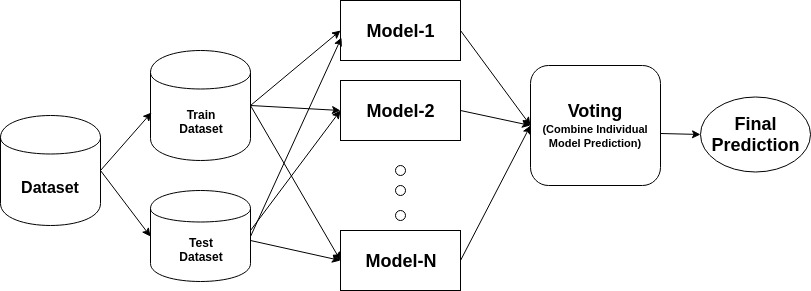

In [68]:
# ADABoost
from sklearn.ensemble import AdaBoostClassifier

In [69]:
param_grid = { 
    'n_estimators':[40,50,60], 
    'learning_rate':[0.01, 0.1, 1]
}

In [70]:
pipe2 = Pipeline([
('scaler', StandardScaler()),
('classifier', GridSearchCV(AdaBoostClassifier(),
                                 param_grid=param_grid,
                                 cv=5,
                                 refit=True))
])
pipe2.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('classifier',
                 GridSearchCV(cv=5, estimator=AdaBoostClassifier(),
                              param_grid={'learning_rate': [0.01, 0.1, 1],
                                          'n_estimators': [40, 50, 60]}))])

#### Bagging

Library: https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.BaggingClassifier.html

Bagging is a type of ensemble machine learning approach that combines the outputs from many learner to improve performance. These algorithms function by breaking down the training set into subsets and running them through various machine-learning models, after which combining their predictions when they return together to generate an overall prediction for each instance in the original data.

Bagging is commonly used in machine learning for classification problems, particularly when using decision trees or artificial neural networks as part of a boosting ensemble. It has been applied to various machine-learning algorithms including decision stumps, artificial neural networks (including multi-layer perceptron), support vector machines and maximum entropy classifiers. Bagging can be applied to regression problems, but it has been found to be lesser effective than for classification.

Bagging technique is also called bootstrap aggregation. It is a data sampling technique where data is sampled with replacement. Bootstrap aggregation is a machine learning ensemble meta-algorithm for reducing the variance of an estimate produced by bagging, which reduces its stability and enhances its bias. Bagging classifier helps combine prediction of different estimators and in turn helps reduce variance.  

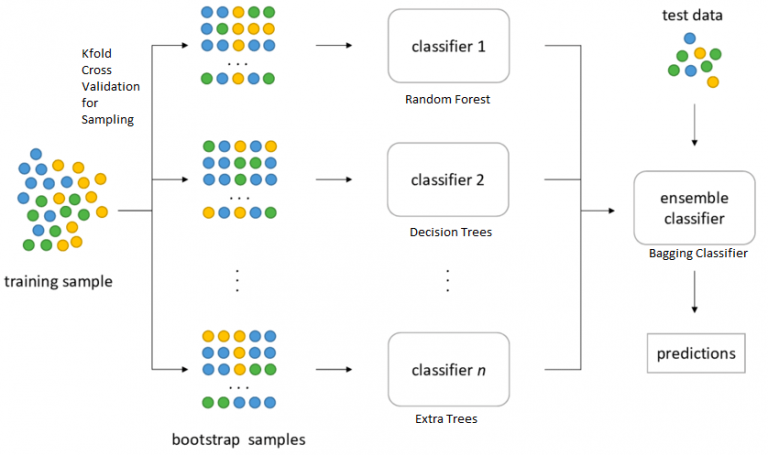

In [71]:
# Bagging
from sklearn.ensemble import BaggingClassifier

In [72]:
param_grid = { 
    'n_estimators':[40,50,60], 
    
}

In [73]:
pipe3 = Pipeline([
('scaler', StandardScaler()),
('classifier', GridSearchCV(BaggingClassifier(),
                                 param_grid=param_grid,
                                 cv=4,
                                 refit=True))
])
pipe3.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('classifier',
                 GridSearchCV(cv=4, estimator=BaggingClassifier(),
                              param_grid={'n_estimators': [40, 50, 60]}))])

#### XGBoost

Library: https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingClassifier.html

XGBoost is short for “eXtreme Gradient Boosting.” The “eXtreme” refers to speed enhancements such as parallel computing and cache awareness that makes XGBoost approximately 10 times faster than traditional Gradient Boosting. In addition, XGBoost includes a unique split-finding algorithm to optimize trees, along with built-in regularization that reduces overfitting. Generally speaking, XGBoost is a faster, more accurate version of Gradient Boosting.

Boosting performs better than bagging on average, and Gradient Boosting is arguably the best boosting ensemble. Since XGBoost is an advanced version of Gradient Boosting, and its results are unparalleled, it’s arguably the best machine learning ensemble that we have.

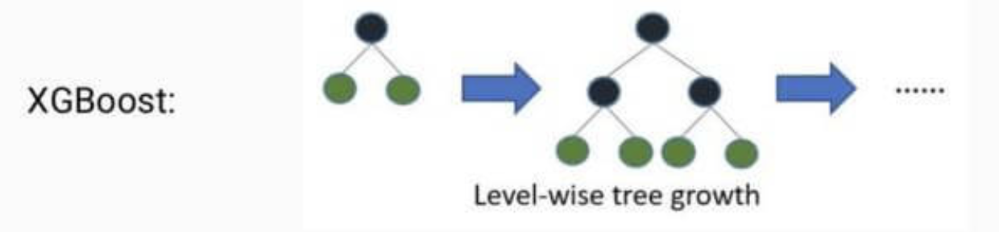

In [74]:
# XGBoost
from xgboost import XGBClassifier

In [75]:
param_grid = { 
    'n_estimators':[40,50,60], 
    'learning_rate':[0.01, 0.1, 1]
}

In [76]:
pipe4 = Pipeline([
('scaler', StandardScaler()),
('classifier', GridSearchCV(XGBClassifier(),
                                 param_grid=param_grid,
                                 cv=4,
                                 refit=True))
])
pipe4.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('classifier',
                 GridSearchCV(cv=4,
                              estimator=XGBClassifier(base_score=None,
                                                      booster=None,
                                                      colsample_bylevel=None,
                                                      colsample_bynode=None,
                                                      colsample_bytree=None,
                                                      gamma=None, gpu_id=None,
                                                      importance_type='gain',
                                                      interaction_constraints=None,
                                                      learning_rate=None,
                                                      max_delta_step=None,
                                                      max_depth=None,
                                                      mi

***

## Leakage

Data leakage can cause you to create overly optimistic if not completely invalid predictive models. Data leakage is when information from outside the training dataset is used to create the model. This additional information can allow the model to learn or know something that it otherwise would not know and in turn invalidate the estimated performance of the mode being constructed.

It is a serious problem for at least 3 reasons:
* It is a problem if you are running a machine learning competition. Top models will use the leaky data rather than be good general model of the underlying problem.
* It is a problem when you are a company providing your data. Reversing an anonymization and obfuscation can result in a privacy breach that you did not expect.
* It is a problem when you are developing your own predictive models. You may be creating overly optimistic models that are practically useless and cannot be used in production.

As machine learning practitioners, we are primarily concerned with this last case.

__Do I have Data Leakage?__

An easy way to know you have data leakage is if you are achieving performance that seems a little too good to be true. For the pipeline that we have used, we see that there is no data leakage as we have dealt with all NaN values appropriately, and the data type has been set uniform across columns. We have also ensured that the new features that we have generated during feature engineering have been used appropriately during training and is available at the time of inference.

***

## Results and Discussion

In our industry, we consider different kinds of metrics to evaluate our models. The choice of metric completely depends on the type of model and the implementation plan of the model. After finishing the building of the model, multiple metrics can be used to help in evaluating your model’s accuracy.

### Metrics

For this project, we are going to use the following performance metrics for each of the training models seperately:

* __Accuracy:__ Classification Accuracy is what we usually mean, when we use the term accuracy. It is the ratio of number of correct predictions to the total number of input samples. It works well only if there are equal number of samples belonging to each class.

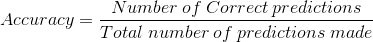

* __Log Loss:__ Logarithmic Loss or Log Loss, works by penalising the false classifications. It works well for multi-class classification. When working with Log Loss, the classifier must assign probability to each class for all the samples. Suppose, there are N samples belonging to M classes, then the Log Loss is calculated as below :

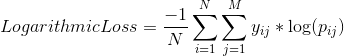

where,
y_ij, indicates whether sample i belongs to class j or not
p_ij, indicates the probability of sample i belonging to class j

* __F-1 Score:__ F1 Score is the Harmonic Mean between precision and recall. The range for F1 Score is [0, 1]. It tells you how precise your classifier is (how many instances it classifies correctly), as well as how robust it is (it does not miss a significant number of instances). High precision but lower recall, gives you an extremely accurate, but it then misses a large number of instances that are difficult to classify. The greater the F1 Score, the better is the performance of our model. Mathematically, it can be expressed as :

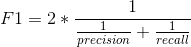

* __Confusion Matrix:__ Confusion Matrix is a tabular visualization of the ground-truth labels versus model predictions. Each row of the confusion matrix represents the instances in a predicted class and each column represents the instances in an actual class. Confusion Matrix is not exactly a performance metric but sort of a basis on which other metrics evaluate the results.

* __ROC AUC:__ The Receiver Operator Characteristic (ROC) curve is an evaluation metric for binary classification problems. It is a probability curve that plots the TPR against FPR at various threshold values and essentially separates the ‘signal’ from the ‘noise’. The Area Under the Curve (AUC) is the measure of the ability of a classifier to distinguish between classes and is used as a summary of the ROC curve. The higher the AUC, the better the performance of the model at distinguishing between the positive and negative classes.

Importing all the necessary metrics libraries:

In [77]:
from sklearn.metrics import log_loss
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.metrics import f1_score 
import matplotlib.pyplot as plt
from sklearn import metrics

model_compare = []

### Model Results

#### Naive Bayes

In [78]:
print('Training accuracy: ' + str(pipe_naive_bayes.score(X_train,y_train)))
y_pred = pipe_naive_bayes.predict(X_valid)
print('Test accuracy: ' + str(accuracy_score(y_valid,y_pred)))
print('Log loss: ',log_loss(y_valid,y_pred))
print('F1 Score: ',f1_score(y_valid,y_pred,average = 'weighted'))
print('Confusion Matrix: ','\n',confusion_matrix(y_valid, y_pred))
print('ROC_AUC: ',roc_auc_score(y_valid, pipe_naive_bayes.predict_proba(X_valid)[:, 1]))

Training accuracy: 0.8528170731707317
Test accuracy: 0.8502764227642277
Log loss:  5.171345344476074
F1 Score:  0.8635969025926052
Confusion Matrix:  
 [[50637  5860]
 [ 3348  1655]]
ROC_AUC:  0.7273145927124152


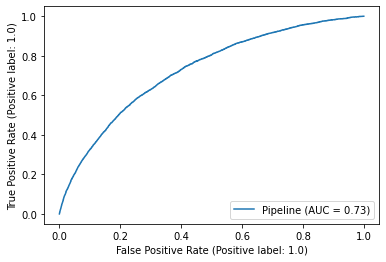

In [79]:
model_compare.append(['Naive Bayes',pipe_naive_bayes.score(X_train,y_train),accuracy_score(y_valid,y_pred),log_loss(y_valid,y_pred),f1_score(y_valid,y_pred,average = 'weighted'),roc_auc_score(y_valid, pipe_naive_bayes.predict_proba(X_valid)[:, 1])])
metrics.plot_roc_curve(pipe_naive_bayes, X_valid, y_valid)

#### Logistic Regression

In [80]:
print('Training accuracy: ' + str(pipe.score(X_train,y_train)))
y_pred = pipe.predict(X_valid)
print('Test accuracy: ' + str(accuracy_score(y_valid,y_pred)))
print('Log loss: ',log_loss(y_valid,y_pred))
print('F1 Score: ',f1_score(y_valid,y_pred,average = 'weighted'))
print('Confusion Matrix: ','\n',confusion_matrix(y_valid, y_pred))
print('ROC_AUC: ',roc_auc_score(y_valid, pipe.predict_proba(X_valid)[:, 1]))

Training accuracy: 0.9193821138211382
Test accuracy: 0.9186016260162602
Log loss:  2.8114005629733114
F1 Score:  0.8803700985178491
Confusion Matrix:  
 [[56472    25]
 [ 4981    22]]
ROC_AUC:  0.7339861123947258


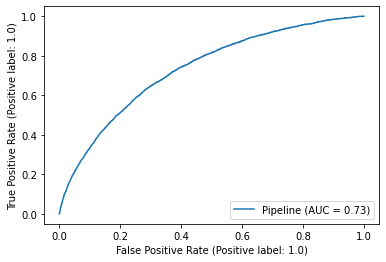

In [81]:
model_compare.append(['Logistic Regression',pipe.score(X_train,y_train),accuracy_score(y_valid,y_pred),log_loss(y_valid,y_pred),f1_score(y_valid,y_pred,average = 'weighted'),roc_auc_score(y_valid, pipe.predict_proba(X_valid)[:, 1])])
metrics.plot_roc_curve(pipe, X_valid, y_valid)

#### Random Forest

In [82]:
print('Training accuracy: ' + str(pipe1.score(X_train,y_train)))
y_pred = pipe1.predict(X_valid)
print('Test accuracy: ' + str(accuracy_score(y_valid,y_pred)))
print('Log loss: ',log_loss(y_valid,y_pred))
print('F1 Score: ',f1_score(y_valid,y_pred,average = 'weighted'))
print('Confusion Matrix: ','\n',confusion_matrix(y_valid, y_pred))
print('ROC_AUC: ',roc_auc_score(y_valid, pipe1.predict_proba(X_valid)[:, 1]))

Training accuracy: 0.924150406504065
Test accuracy: 0.9186666666666666
Log loss:  2.8091541904986785
F1 Score:  0.8806527385293619
Confusion Matrix:  
 [[56468    29]
 [ 4973    30]]
ROC_AUC:  0.7362249163767931


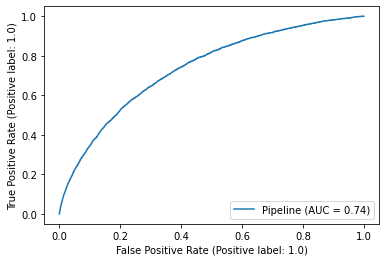

In [83]:
model_compare.append(['Random Forest',pipe1.score(X_train,y_train),accuracy_score(y_valid,y_pred),log_loss(y_valid,y_pred),f1_score(y_valid,y_pred,average = 'weighted'),roc_auc_score(y_valid, pipe1.predict_proba(X_valid)[:, 1])])
metrics.plot_roc_curve(pipe1, X_valid, y_valid)

#### AdaBoost

In [85]:
print('Training accuracy: ' + str(pipe2.score(X_train,y_train)))
y_pred = pipe2.predict(X_valid)
print('Test accuracy: ' + str(accuracy_score(y_valid,y_pred)))
print('Log loss: ',log_loss(y_valid,y_pred))
print('F1 Score: ',f1_score(y_valid,y_pred,average = 'weighted'))
print('Confusion Matrix: ','\n',confusion_matrix(y_valid, y_pred))
print('ROC_AUC: ',roc_auc_score(y_valid, pipe2.predict_proba(X_valid)[:, 1]))

Training accuracy: 0.9194308943089431
Test accuracy: 0.918650406504065
Log loss:  2.8097154195729788
F1 Score:  0.879700196043292
Confusion Matrix:  
 [[56497     0]
 [ 5003     0]]
ROC_AUC:  0.6871204002911102


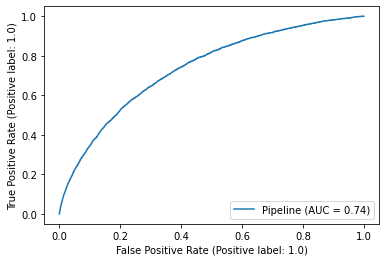

In [86]:
model_compare.append(['AdaBoost',pipe2.score(X_train,y_train),accuracy_score(y_valid,y_pred),log_loss(y_valid,y_pred),f1_score(y_valid,y_pred,average = 'weighted'),roc_auc_score(y_valid, pipe2.predict_proba(X_valid)[:, 1])])
metrics.plot_roc_curve(pipe1, X_valid, y_valid)

#### Bagging

In [88]:
print('Training accuracy: ' + str(pipe3.score(X_train,y_train)))
y_pred = pipe3.predict(X_valid)
print('Test accuracy: ' + str(accuracy_score(y_valid,y_pred)))
print('Log loss: ',log_loss(y_valid,y_pred))
print('F1 Score: ',f1_score(y_valid,y_pred,average = 'weighted'))
print('Confusion Matrix: ','\n',confusion_matrix(y_valid, y_pred))
print('ROC_AUC: ',roc_auc_score(y_valid, pipe3.predict_proba(X_valid)[:, 1]))

Training accuracy: 0.9996138211382114
Test accuracy: 0.9182926829268293
Log loss:  2.8220726524496103
F1 Score:  0.8832652331886339
Confusion Matrix:  
 [[56351   146]
 [ 4879   124]]
ROC_AUC:  0.7011701239871685


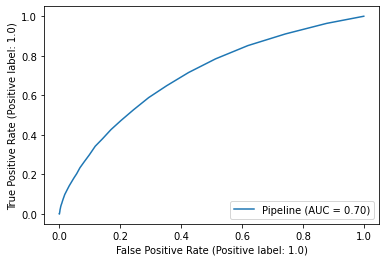

In [89]:
model_compare.append(['Bagging',pipe3.score(X_train,y_train),accuracy_score(y_valid,y_pred),log_loss(y_valid,y_pred),f1_score(y_valid,y_pred,average = 'weighted'),roc_auc_score(y_valid, pipe3.predict_proba(X_valid)[:, 1])])
metrics.plot_roc_curve(pipe3, X_valid, y_valid)

#### XGBoost

In [91]:
print('Training accuracy: ' + str(pipe4.score(X_train,y_train)))
y_pred = pipe4.predict(X_valid)
print('Test accuracy: ' + str(accuracy_score(y_valid,y_pred)))
print('Log loss: ',log_loss(y_valid,y_pred))
print('F1 Score: ',f1_score(y_valid,y_pred,average = 'weighted'))
print('Confusion Matrix: ','\n',confusion_matrix(y_valid, y_pred))
print('ROC_AUC: ',roc_auc_score(y_valid, pipe4.predict_proba(X_valid)[:, 1]))

Training accuracy: 0.9194552845528455
Test accuracy: 0.9186341463414635
Log loss:  2.810277051696389
F1 Score:  0.8797239210009311
Confusion Matrix:  
 [[56495     2]
 [ 5002     1]]
ROC_AUC:  0.7393593845285834


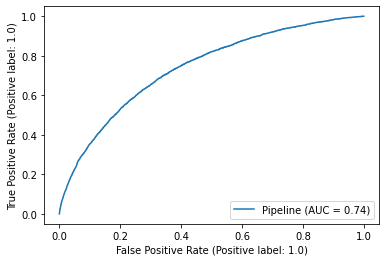

In [92]:
model_compare.append(['XGBoost',pipe4.score(X_train,y_train),accuracy_score(y_valid,y_pred),log_loss(y_valid,y_pred),f1_score(y_valid,y_pred,average = 'weighted'),roc_auc_score(y_valid, pipe4.predict_proba(X_valid)[:, 1])])
metrics.plot_roc_curve(pipe4, X_valid, y_valid)

### Compiled results

In [93]:
pd.DataFrame(model_compare,columns = ['Model Name', 'Training Accuracy', 'Test Accuracy','LogLoss','F1','ROC-AUC'])

,Model Name,Training Accuracy,Test Accuracy,LogLoss,F1,ROC-AUC
0,Naive Bayes,0.852817,0.850276,5.171345,0.863597,0.727315
1,Logistic Regression,0.919382,0.918602,2.811401,0.880370,0.733986
2,Random Forest,0.924150,0.918667,2.809154,0.880653,0.736225
3,AdaBoost,0.919431,0.918650,2.809715,0.879700,0.687120
4,Bagging,0.999614,0.918293,2.822073,0.883265,0.701170
5,XGBoost,0.919455,0.918634,2.810277,0.879724,0.739359


Here we see that the Bagging Classifier has the highest training accuracy of 99.9%, but an accuracy like this carries the risk of overfitting. As for the XGBoost model, the training accuracy is 91.9%. This score is good enough and appears to be a reliable model. Based on the ROC Area Under Curve values for the XGBoost model, the ROC values is 0.739, showing a large amount of True Positive values, indicating a good fit to the data. As shown in the combined table above, compared to all other models, XGBoost seems to be the best fitting model based on ROC-AUC value.

### CSV files creation for kaggle submission 

Machine learning competitions are a great way to improve your skills and measure your progress as a data scientist. If you are using data from a competition on Kaggle, you can easily submit it from your notebook. We make submissions in CSV files. Your submissions usually have two columns: an ID column and a prediction column. The ID field comes from the test data (keeping whatever name the ID field had in that data, which for the housing data is the string 'Id'). The prediction column will use the name of the target field.

In [94]:
df_numerical.drop(columns = ['TARGET'],inplace=True)
df_cols = list(df_numerical.columns)+ list(df_categorical.columns)
df_cols
df_test

/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48739,456221,Cash loans,F,N,Y,0,121500.0,412560.0,17473.5,270000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
48740,456222,Cash loans,F,N,N,2,157500.0,622413.0,31909.5,495000.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
48741,456223,Cash loans,F,Y,Y,1,202500.0,315000.0,33205.5,315000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,3.0,1.0
48742,456224,Cash loans,M,N,N,0,225000.0,450000.0,25128.0,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0


In [95]:
df_test_final = df_test[df_cols]
df_test_final

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE
0,100001,0,135000.0,568800.0,20560.5,450000.0,0.018850,-19241,-2329,-5170.0,...,F,N,Y,Unaccompanied,Working,Higher education,Married,House / apartment,TUESDAY,Kindergarten
1,100005,0,99000.0,222768.0,17370.0,180000.0,0.035792,-18064,-4469,-9118.0,...,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,FRIDAY,Self-employed
2,100013,0,202500.0,663264.0,69777.0,630000.0,0.019101,-20038,-4458,-2175.0,...,M,Y,Y,NaN,Working,Higher education,Married,House / apartment,MONDAY,Transport: type 3
3,100028,2,315000.0,1575000.0,49018.5,1575000.0,0.026392,-13976,-1866,-2000.0,...,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,WEDNESDAY,Business Entity Type 3
4,100038,1,180000.0,625500.0,32067.0,625500.0,0.010032,-13040,-2191,-4000.0,...,M,Y,N,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,FRIDAY,Business Entity Type 3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48739,456221,0,121500.0,412560.0,17473.5,270000.0,0.002042,-19970,-5169,-9094.0,...,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Widow,House / apartment,WEDNESDAY,Other
48740,456222,2,157500.0,622413.0,31909.5,495000.0,0.035792,-11186,-1149,-3015.0,...,F,N,N,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,MONDAY,Trade: type 7
48741,456223,1,202500.0,315000.0,33205.5,315000.0,0.026392,-15922,-3037,-2681.0,...,F,Y,Y,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,WEDNESDAY,Business Entity Type 3
48742,456224,0,225000.0,450000.0,25128.0,450000.0,0.018850,-13968,-2731,-1461.0,...,M,N,N,Family,Commercial associate,Higher education,Married,House / apartment,MONDAY,Self-employed


In [96]:
num_pipeline1 = Pipeline(steps=[('imputer', SimpleImputer(strategy='mean'))])
cat_pipeline1 = Pipeline([
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('ohe', OneHotEncoder(sparse=False, handle_unknown="ignore"))])

In [97]:
df_test_final_num = df_test_final.select_dtypes(exclude='object')
df_test_final_cat = df_test_final.select_dtypes(include='object')

In [98]:
data_pipeline1 = ColumnTransformer([
    ("num_pipeline", num_pipeline1, df_test_final_num.columns),
    ("cat_pipeline", cat_pipeline1, df_test_final_cat.columns)], n_jobs = -1)
df_transformed1 = data_pipeline1.fit_transform(df_test_final)
column_names = list(df_test_final_num.columns)  + \
               list(data_pipeline1.transformers_[1][1].named_steps["ohe"].get_feature_names(df_test_final_cat.columns))

In [99]:
df_transformed1.shape

(48744, 180)

In [100]:
df_final_test = pd.DataFrame(df_transformed1,columns=column_names)

In [101]:
df_final_test = pd.merge(left=df_final_test, right=previous_application, how='left', left_on='SK_ID_CURR', right_on='SK_ID_CURR')
#df_final_test = pd.merge(left=df_final_test, right=clean_bureau, how='left', left_on='SK_ID_CURR', right_on='SK_ID_CURR')

In [102]:
df_final_test = pd.merge(left=df_final_test, right=clean_bureau, how='left', left_on='SK_ID_CURR', right_on='SK_ID_CURR')

In [103]:
df_final_test

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,SK_DPD_y,SK_DPD_DEF_y,SK_ID_BUREAU,DAYS_CREDIT,DAYS_ENDDATE_FACT,AMT_CREDIT_SUM,DAYS_CREDIT_UPDATE,MONTHS_BALANCE
0,100001.0,0.0,135000.0,568800.0,20560.5,450000.0,0.018850,-19241.0,-2329.0,-5170.0,...,NaN,NaN,NaN,NaN,5896633.0,-857.0,-715.0,168345.00,-155.0,-28.0
1,100005.0,0.0,99000.0,222768.0,17370.0,180000.0,0.035792,-18064.0,-4469.0,-9118.0,...,NaN,NaN,NaN,NaN,6735201.0,-137.0,-123.0,58500.00,-31.0,-4.0
2,100013.0,0.0,202500.0,663264.0,69777.0,630000.0,0.019101,-20038.0,-4458.0,-2175.0,...,0.0,22.0,0.0,0.0,5922081.5,-1835.0,-1168.0,391770.00,-882.0,-59.5
3,100028.0,2.0,315000.0,1575000.0,49018.5,1575000.0,0.026392,-13976.0,-1866.0,-2000.0,...,2.0,19.5,0.0,0.0,6356884.5,-1612.0,-1375.0,129614.04,-683.5,-52.5
4,100038.0,1.0,180000.0,625500.0,32067.0,625500.0,0.010032,-13040.0,-2191.0,-4000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48739,456221.0,0.0,121500.0,412560.0,17473.5,270000.0,0.002042,-19970.0,-5169.0,-9094.0,...,NaN,NaN,NaN,NaN,6645689.0,-601.0,-603.0,145867.50,-99.0,-19.0
48740,456222.0,2.0,157500.0,622413.0,31909.5,495000.0,0.035792,-11186.0,-1149.0,-3015.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
48741,456223.0,1.0,202500.0,315000.0,33205.5,315000.0,0.026392,-15922.0,-3037.0,-2681.0,...,NaN,NaN,NaN,NaN,6433063.0,-349.0,-406.0,54000.00,-159.0,-11.0
48742,456224.0,0.0,225000.0,450000.0,25128.0,450000.0,0.018850,-13968.0,-2731.0,-1461.0,...,NaN,NaN,NaN,NaN,6436438.0,-1421.0,-1513.0,147339.00,-1058.0,-46.0


In [104]:
df_final_test['FEATURE1']= df_final_test['AMT_TOTAL_RECEIVABLE']/(df_final_test['AMT_BALANCE']+1)
df_final_test['FEATURE2'] = df_final_test['AMT_TOTAL_RECEIVABLE']/(df_final_test['AMT_RECIVABLE']+1)
df_final_test['FEATURE3'] = df_final_test['AMT_TOTAL_RECEIVABLE']/(df_final_test['AMT_RECEIVABLE_PRINCIPAL']+1)
df_final_test['FEATURE4']=df_final_test['AMT_CREDIT_x'] / (df_final_test['AMT_INCOME_TOTAL']+1)
df_final_test['FEATURE5']=df_final_test['AMT_ANNUITY_x'] / (df_final_test['AMT_INCOME_TOTAL']+1)
df_final_test['FEATURE6']= df_final_test['AMT_ANNUITY_x'] / (df_final_test['AMT_CREDIT_x'] +1)
df_final_test['FEATURE7']=(df_final_test['EXT_SOURCE_1']*df_final_test['EXT_SOURCE_2']*df_final_test['EXT_SOURCE_3'])
#df_final_test['FEATURE8']=df_final_test['NAME_TYPE_SUITE_Spouse, partner'] / (df_final_test['REGION_RATING_CLIENT_W_CITY']+1)
#df_final_test['FEATURE9']=df_final_test['REGION_RATING_CLIENT'] / (df_final_test['REGION_RATING_CLIENT_W_CITY']+1)

In [105]:
df_final_test.rename(columns={'AMT_CREDIT_y':'AMT_CREDIT'},inplace=True)

In [106]:
df_final_test = df_final_test.apply(lambda x: x.fillna(x.median()),axis=0)

In [107]:
print(clean_bureau.columns)

Index(['SK_ID_CURR', 'SK_ID_BUREAU', 'DAYS_CREDIT', 'DAYS_ENDDATE_FACT',
       'AMT_CREDIT_SUM', 'DAYS_CREDIT_UPDATE', 'MONTHS_BALANCE'],
      dtype='object')


In [109]:
corr_greater_than_5

,col_name,Correlation
0,TARGET,1.000000
1,DAYS_CREDIT,0.079099
2,DAYS_BIRTH,0.078236
3,DAYS_CREDIT_UPDATE,0.063527
4,REGION_RATING_CLIENT_W_CITY,0.060875
5,REGION_RATING_CLIENT,0.058882
6,NAME_INCOME_TYPE_Working,0.057504
7,DAYS_LAST_PHONE_CHANGE,0.055228
8,CODE_GENDER_M,0.054729
9,DAYS_ID_PUBLISH,0.051455


In [111]:
selected_features = corr_greater_than_5['col_name']

In [112]:
#selected_features.to_csv('final_application_test.csv')

In [113]:
corr_greater_than_5.drop(0)

,col_name,Correlation
1,DAYS_CREDIT,0.079099
2,DAYS_BIRTH,0.078236
3,DAYS_CREDIT_UPDATE,0.063527
4,REGION_RATING_CLIENT_W_CITY,0.060875
5,REGION_RATING_CLIENT,0.058882
6,NAME_INCOME_TYPE_Working,0.057504
7,DAYS_LAST_PHONE_CHANGE,0.055228
8,CODE_GENDER_M,0.054729
9,DAYS_ID_PUBLISH,0.051455
10,FEATURE2,0.051093


In [114]:
selected_features = corr_greater_than_5['col_name'].drop(0)


In [115]:
new_df_final_test = df_final_test[selected_features]
new_df_final_test
#new_df_final_test.to_csv('final_application_test.csv')

,DAYS_CREDIT,DAYS_BIRTH,DAYS_CREDIT_UPDATE,REGION_RATING_CLIENT_W_CITY,REGION_RATING_CLIENT,NAME_INCOME_TYPE_Working,DAYS_LAST_PHONE_CHANGE,CODE_GENDER_M,DAYS_ID_PUBLISH,FEATURE2,REG_CITY_NOT_WORK_CITY,CODE_GENDER_F,NAME_EDUCATION_TYPE_Higher education,EXT_SOURCE_1,EXT_SOURCE_3,EXT_SOURCE_2,FEATURE7
0,-857.0,-19241.0,-155.00,2.0,2.0,1.0,-1740.0,0.0,-812.0,0.000000,0.0,1.0,1.0,0.752614,0.159520,0.789654,0.094803
1,-137.0,-18064.0,-31.00,2.0,2.0,1.0,0.0,1.0,-1623.0,0.000000,0.0,0.0,0.0,0.564990,0.432962,0.291656,0.071345
2,-1835.0,-20038.0,-882.00,2.0,2.0,1.0,-856.0,1.0,-3503.0,0.000000,0.0,0.0,1.0,0.501180,0.610991,0.699787,0.214286
3,-1612.0,-13976.0,-683.50,2.0,2.0,1.0,-1805.0,0.0,-4208.0,0.999863,0.0,1.0,0.0,0.525734,0.612704,0.509677,0.164177
4,-981.0,-13040.0,-320.25,2.0,2.0,1.0,-821.0,1.0,-4262.0,0.000000,1.0,0.0,0.0,0.202145,0.500106,0.425687,0.043034
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48739,-601.0,-19970.0,-99.00,3.0,3.0,1.0,-684.0,0.0,-3399.0,0.000000,0.0,1.0,0.0,0.501180,0.643026,0.648575,0.209017
48740,-981.0,-11186.0,-320.25,2.0,2.0,0.0,0.0,0.0,-3003.0,0.000000,1.0,1.0,0.0,0.501180,0.500106,0.684596,0.171589
48741,-349.0,-15922.0,-159.00,2.0,2.0,0.0,-838.0,0.0,-1504.0,0.000000,0.0,1.0,0.0,0.733503,0.283712,0.632770,0.131682
48742,-1421.0,-13968.0,-1058.00,2.0,2.0,0.0,-2308.0,1.0,-1364.0,0.000000,1.0,0.0,1.0,0.373090,0.595456,0.445701,0.099016


In [116]:
X = new_df_final_test.values

In [117]:
result = pipe4.predict(X)
result_prob = pipe4.predict_proba(X)
r = pd.DataFrame(result_prob,columns=['class_0_prob','class_1_prob'])
r[['class_0_prob','class_1_prob']] = result_prob
final_sub = pd.DataFrame()
final_sub['SK_ID_CURR'] = df_test['SK_ID_CURR']
final_sub['TARGET'] = r['class_1_prob']
final_sub = final_sub.set_index('SK_ID_CURR')

In [118]:
final_sub

,TARGET
SK_ID_CURR,
100001,0.059373
100005,0.117161
100013,0.031515
100028,0.050429
100038,0.133859
...,...
456221,0.040164
456222,0.072552
456223,0.073067


In [119]:
final_sub.to_csv('submission.csv')

***

## Neural Network

Neural networks, also known as artificial neural networks (ANNs) or simulated neural networks (SNNs), are a subset of machine learning and are at the heart of deep learning algorithms. Their name and structure are inspired by the human brain, mimicking the way that biological neurons signal to one another.

Artificial neural networks (ANNs) are comprised of a node layers, containing an input layer, one or more hidden layers, and an output layer. Each node, or artificial neuron, connects to another and has an associated weight and threshold. If the output of any individual node is above the specified threshold value, that node is activated, sending data to the next layer of the network. Otherwise, no data is passed along to the next layer of the network.

Neural networks rely on training data to learn and improve their accuracy over time. However, once these learning algorithms are fine-tuned for accuracy, they are powerful tools in computer science and artificial intelligence, allowing us to classify and cluster data at a high velocity. Tasks in speech recognition or image recognition can take minutes versus hours when compared to the manual identification by human experts. One of the most well-known neural networks is Google’s search algorithm.

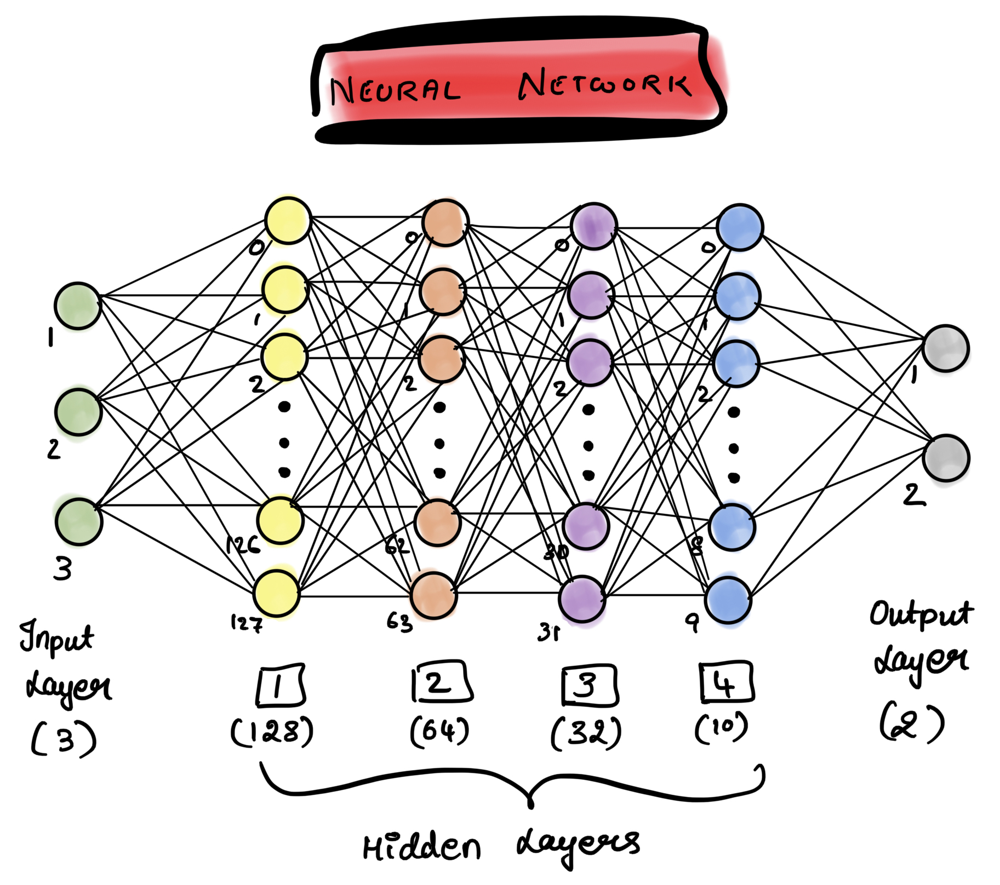

In [120]:
import torch
import torch.nn as nn
import torch.nn.functional as Function
import torch.optim as optim
import torchvision
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter("runs/")
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split
import pandas as pd
import matplotlib.pyplot as plt

In [121]:
def corr_target(df,cor):
    correlation = df.corr()['TARGET'].sort_values(ascending=False).reset_index()
    correlation.columns = ['col_name','Correlation']
    after_correlation = correlation[abs(correlation['Correlation'])>cor]
    return after_correlation

In [122]:
# Taking features that have correlation of at least 10% with target variable.
train_df = pd.read_csv('final_application_train.csv')
train_df = train_df.iloc[:,1:]
train_df_cols = corr_target(train_df,0.1)
train_df = train_df[train_df_cols['col_name']]

In [123]:
train_df

,TARGET,EXT_SOURCE_3,EXT_SOURCE_2,FEATURE7
0,1.0,0.139376,0.262949,0.003043
1,0.0,0.510856,0.622246,0.098945
2,0.0,0.729567,0.555912,0.203649
3,0.0,0.510856,0.650442,0.166847
4,0.0,0.510856,0.322738,0.082786
...,...,...,...,...
307495,0.0,0.510856,0.681632,0.050690
307496,0.0,0.510856,0.115992,0.029753
307497,0.0,0.218859,0.535722,0.087235
307498,1.0,0.661024,0.514163,0.170659


In [125]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [126]:
X = train_df.drop('TARGET',axis=1).values
y = train_df['TARGET'].values
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=123)

X_train = torch.FloatTensor(X_train)
X_test = torch.FloatTensor(X_test)
y_train = torch.tensor(y_train, dtype=torch.long, device=device)
y_test = torch.tensor(y_test, dtype=torch.long, device=device)

In [127]:
# Implementin Neural Network with 4 Hidden Layers

In [128]:
class Neural_Network(nn.Module):
    def __init__(self,):
        super().__init__()
        self.input_layer_size=3
        self.hidden_layer1_size=128
        self.hidden_layer2_size=64
        self.hidden_layer3_size=32
        self.hidden_layer4_size=10
        self.output_layer_size=2
        #self.softmax= nn.Softmax(dim=1)
        self.W1 = nn.Linear(self.input_layer_size, self.hidden_layer1_size)
        self.W2 = nn.Linear( self.hidden_layer1_size, self.hidden_layer2_size)
        self.W3 = nn.Linear( self.hidden_layer2_size, self.hidden_layer3_size)
        self.W4 = nn.Linear( self.hidden_layer3_size,self.hidden_layer4_size)
        self.out = nn.Linear(self.hidden_layer4_size,self.output_layer_size)
    
    def forward(self,x):
        x = Function.relu(self.W1(x))
        x = Function.relu(self.W2(x))
        x = Function.relu(self.W3(x))
        x = Function.relu(self.W4(x))
        x = self.out(x)
        #x = self.softmax(x)
        return x
        
        
        
        

In [129]:
# Defining Loss Function and Optimizer
torch.manual_seed(20)
model= Neural_Network().to(device)
loss_function = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(),lr=0.001)

In [130]:
pred = []
with torch.no_grad():
    for i,data in enumerate(X_test):
        y_pred = model(data)
        pred.append(y_pred.argmax().item())



In [131]:
from sklearn.metrics import confusion_matrix
print('Confusion Matrix:')
confusion_matrix(y_test,pred)

Confusion Matrix:


array([[56554,     0],
       [ 4946,     0]])

In [132]:
from sklearn.metrics import f1_score 
print('F1 Score: ',f1_score(y_test,pred,average = 'weighted'))

F1 Score:  0.8810505529989652


In [133]:
from sklearn.metrics import log_loss
print('Log Loss: ',log_loss(y_test,pred))

Log Loss:  2.777703870719159


In [134]:
from sklearn.metrics import roc_auc_score
auc = roc_auc_score(y_test,pred)
auc

0.5

In [135]:
# Calculating Loss at different iterations and calculating the accuracy
iterations = 500
total_loss = []
total_acc = []
shape = y_train.shape[0]
for i in range(iterations):
    i +=1
    y_pred = model.forward(X_train)
    loss = loss_function(y_pred,y_train)
    total_loss.append(loss.item())
    _,predicted = torch.max(y_pred,1)
    acc = (predicted==y_train).sum().item()
    total_acc.append(acc/shape)
    if i%50 == 1:
        print("Loss for Iteration", i,'is',(loss.item()))
        print('Train_Accuracy for Iteration',i,'is', (acc/shape)*100,'%')
        writer.add_scalar('Training loss',loss.item(),i)
        writer.add_scalar('Accuracy',acc/shape,i)
    optimizer.zero_grad()
    loss.backward()

Loss for Iteration 1 is 0.6235156655311584
Train_Accuracy for Iteration 1 is 91.91991869918698 %
Loss for Iteration 51 is 0.6235156655311584
Train_Accuracy for Iteration 51 is 91.91991869918698 %
Loss for Iteration 101 is 0.6235156655311584
Train_Accuracy for Iteration 101 is 91.91991869918698 %
Loss for Iteration 151 is 0.6235156655311584
Train_Accuracy for Iteration 151 is 91.91991869918698 %
Loss for Iteration 201 is 0.6235156655311584
Train_Accuracy for Iteration 201 is 91.91991869918698 %
Loss for Iteration 251 is 0.6235156655311584
Train_Accuracy for Iteration 251 is 91.91991869918698 %
Loss for Iteration 301 is 0.6235156655311584
Train_Accuracy for Iteration 301 is 91.91991869918698 %
Loss for Iteration 351 is 0.6235156655311584
Train_Accuracy for Iteration 351 is 91.91991869918698 %
Loss for Iteration 401 is 0.6235156655311584
Train_Accuracy for Iteration 401 is 91.91991869918698 %
Loss for Iteration 451 is 0.6235156655311584
Train_Accuracy for Iteration 451 is 91.9199186991869

In [147]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [146]:
!pip install tensorboard

You should consider upgrading via the '/opt/anaconda3/bin/python -m pip install --upgrade pip' command.


In [150]:
%tensorboard --logdir=runs

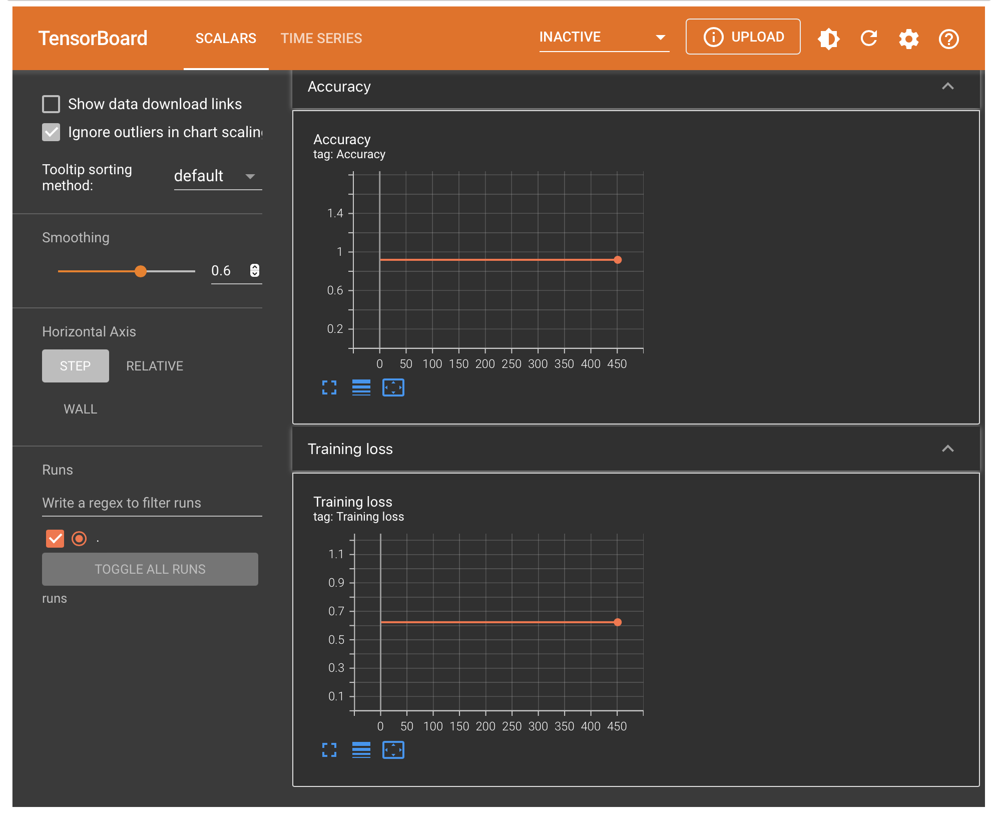

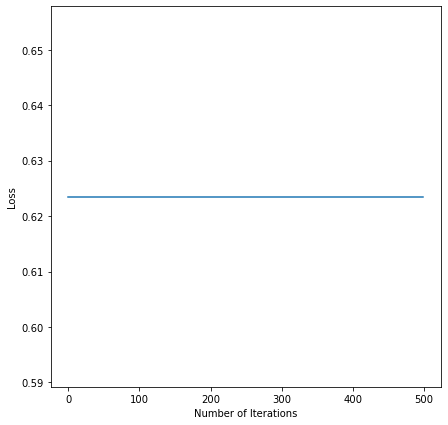

In [136]:
with torch.no_grad():
    plt.figure(figsize=(7,7))
    plt.plot(range(iterations), total_loss)
    plt.ylabel('Loss')
    plt.xlabel('Number of Iterations')
    

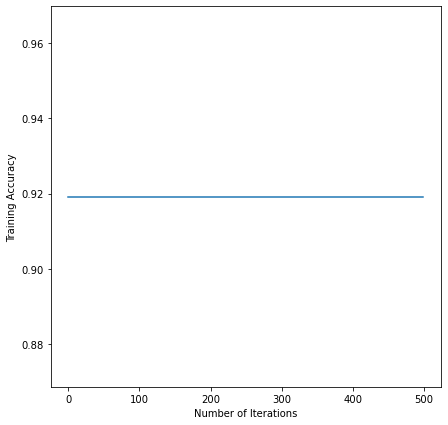

In [137]:
with torch.no_grad():
    plt.figure(figsize=(7,7))
    plt.plot(range(iterations), total_acc)
    plt.ylabel('Training Accuracy')
    plt.xlabel('Number of Iterations')

In [138]:
# Testing Accuracy
from sklearn.metrics import accuracy_score
test_acc = accuracy_score(y_test,pred)
print(test_acc * 100,'%')

91.95772357723577 %


In [139]:
test_df = pd.read_csv('final_application_test.csv')
test_df = test_df.iloc[:,1:]

In [140]:
test_cols = list(train_df.columns)
test_cols.remove('TARGET')

In [141]:
testing = torch.FloatTensor(test_df[test_cols].values)

In [151]:
prediction = []
probability = []
with torch.no_grad():
    for i,data in enumerate(testing):
        y_pred = model(data)
        prediction.append(y_pred.argmax().item())
        probability.append(Function.softmax(y_pred)[1].item())

<ipython-input-151-59b097dfe771>:7: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  probability.append(Function.softmax(y_pred)[1].item())


In [153]:
sub = pd.DataFrame()

sub["SK_ID_CURR"]= df_test['SK_ID_CURR']
sub['TARGET'] = probability
sub.set_index('SK_ID_CURR')


sub.to_csv('submission_nn4.csv',index=False)

__The following are the results achieved through trial and error considering different number of hidden layers:__

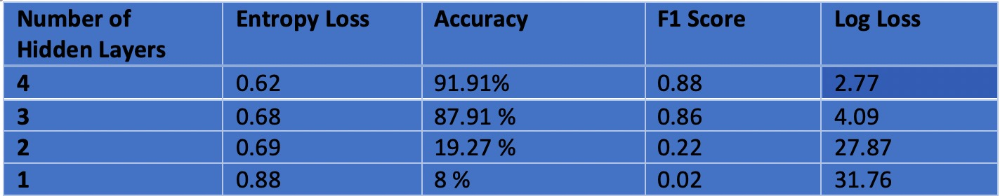

We can see from the table that as the number of hidden layers increase, the accuarcy also increases.

***

## Kaggle submission

__The results for our project submission on kaggle is as follows:__

Note: We did not submit the file for Naive Bayes because the accuracy is way too low to begin with.

* __Logistic regression:__

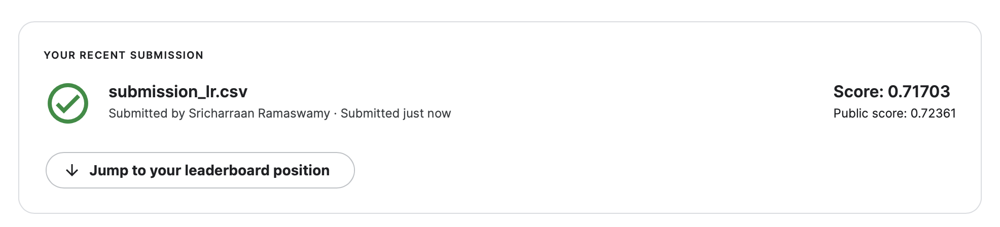

* __Random Forest:__

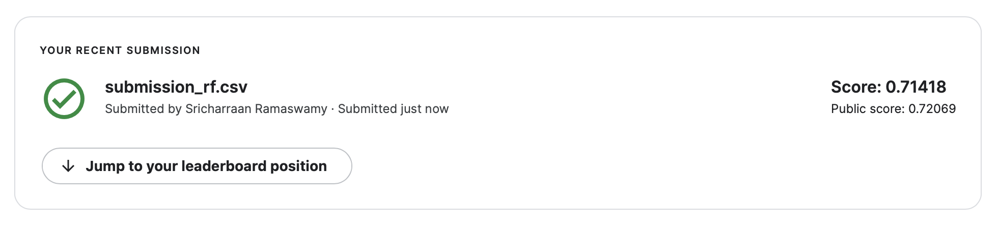

* __AdaBoost:__

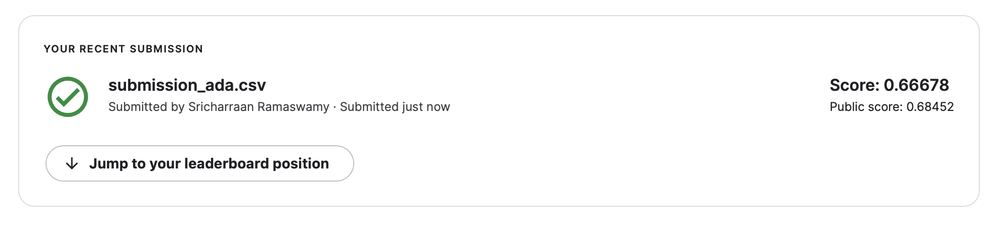

* __Bagging:__

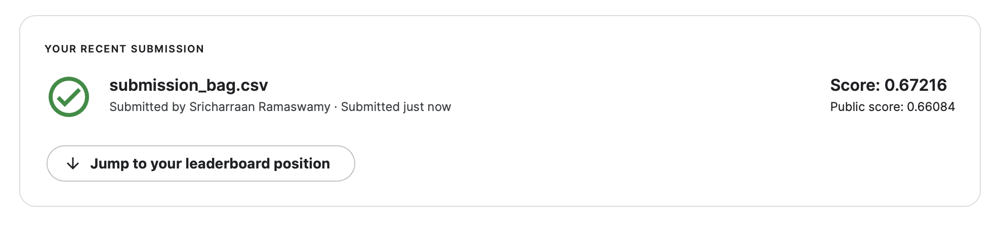

* __XGBoost:__

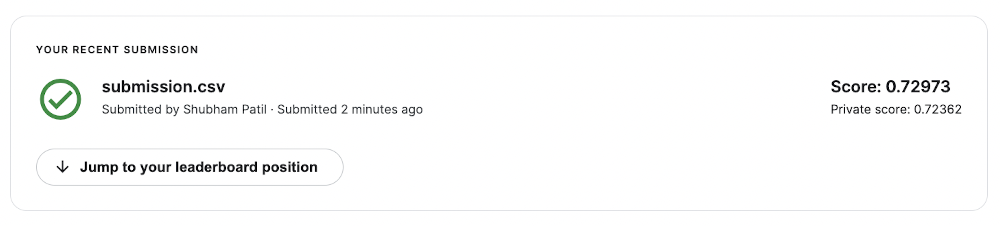

* __Neural Networks:__

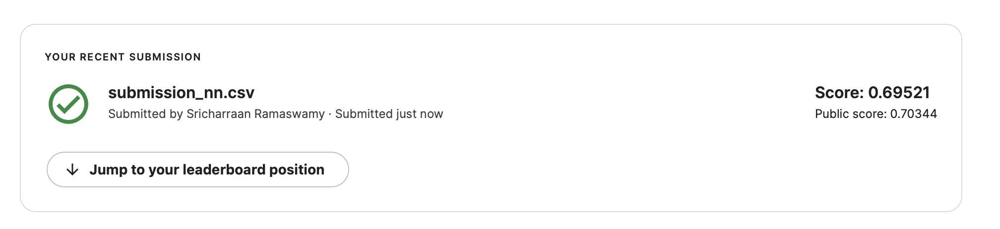

__Summary of kaggle submission:__

* Logestic Regression - 0.71703
* Random Forest - 0.71418
* AdaBoost - 0.66678
* Bagging - 0.67216
* XGBoost - 0.72973
* Neural Networks - 0.69521

__Best model:__ XGBoost

***

## Conclusions

We are attempting to predict whether the credit-less population will be able to repay their loans. We sourced our data from the Home Credit dataset in order to realize this goal. Having a fair chance to obtain a loan is extremely important to this population, and as students we have a strong connection with this. As a result, we have decided to pursue this project. During the first phase, we begin to experiment with the dataset. After performing OHE on the data, we used imputation techniques to fix it before feeding it into the model. In phase 2, we implemented feature engineering and hyperparameter tuning to refine the results.

Finally, we have evaluated the results using accuracy score, log loss, confusion matrix and ROC AUC scores. In this last phase we implemented a few more other models such as AdaBoost, XGBoost and bagging to the previously used models, namely, logistic regression, random forest and naive bayes. Additionally, we also implemented Multilayer Perceptron(MLP) model using Pytorch for loan default classification. We found out that the training accuracy for the MLP model to be 91.92% and a test accuracy of 91.96% which is pretty close to our previous non deep learning models. Deep Learning models require huge amount of data to train itself and thus on a longer run Deep Learning models would work best for HCDR classification as compared to usual supervised models. 

The best fitting model is XGBoost with the following scores:
* Kernel training score - 0.919455
* Kernel testing score - 0.918634
* ROC-AUC score - 0.739359
* Private kaggle score - 0.72362
* Public kaggle score - 0.72973

The future scope for this project can include using embeddings in deep learning models or using some advanced classification models like lightGBM/other boosting models that can produce better results. Features can be refined more to increase the accuracy of the model.

***

## References

* Pipeline: https://scikit-learn.org/stable/

* Data: https://www.kaggle.com/c/home-credit-default-risk/data

* Metrics: https://towardsdatascience.com/metrics-to-evaluate-your-machine-learning-algorithm-f10ba6e38234

* Professor's baseline notebook: https://github.iu.edu/jshanah/I526_AML_Student/blob/master/Assignments/Unit-Project-Home-Credit-Default-Risk/HCDR_Phase_1_baseline_submission/HCDR_baseLine_submission_with_numerical_and_cat_features_to_kaggle.ipynb

***